In [2]:
import matplotlib.pyplot as plt
import numpy as np
import IPython
import pandas as pd
import seaborn as sns

In [6]:
from ivhd.sheppards_diagram import ShepardDiagram

In [7]:
!docker images

REPOSITORY                    TAG       IMAGE ID       CREATED         SIZE
viskit                        latest    a28b16e50e67   47 hours ago    2.96GB
opencl                        latest    c6786de56b98   14 months ago   5.65GB
<none>                        <none>    22ac98cdb09a   14 months ago   6.02GB
<none>                        <none>    90f216ad402c   14 months ago   6.02GB
<none>                        <none>    337103181ee6   14 months ago   5.63GB
<none>                        <none>    288442981b68   14 months ago   5.12GB
<none>                        <none>    fa1ccf763df3   14 months ago   5.12GB
<none>                        <none>    95f540a1d0f4   14 months ago   5.12GB
<none>                        <none>    e9f7433cd8a1   14 months ago   5.12GB
mlflow_demo                   latest    dab7b70c5388   14 months ago   3.26GB
gradflow/workbench/jupyter    0.1.0     1dffddb8f048   14 months ago   4.28GB
gradflow/workbench/mlflow     0.1.0     c8528c0f6b93   14 months a

In [8]:
# import numpy as np
# import pandas as pd


# ################################################################
# ########## można wymyślić jeszcze jakiś dataset ################
# class Datasets:
#     def __init__(self):
#         ...

#     def to_csv(self, dataframe, name):
#         return dataframe.to_csv(name)

#     def ball_points_generator(self, dim, N, radius):
#         # Generowanie macierzy zmiennych losowych o rozkładzie normalnym standardowym
#         xi = np.random.normal(size=(dim, N))

#         # obliczanie normy
#         norm = np.linalg.norm(xi, axis=0)

#         S = xi / norm
#         U = np.random.uniform(low=0.0, high=1.0, size=N)
#         S = S * np.power(U, 1 / dim)
#         points = S * radius

#         # Transponowanie macierzy punktów
#         # points = scaled_xi.T

#         return points.T

#     # %%
#     def sphere_points_generator(self, dim, N, radius):
#         # Generowanie macierzy zmiennych losowych o rozkładzie normalnym standardowym
#         xi = np.random.normal(size=(dim, N))

#         # Obliczanie sumy kwadratów zmiennych losowych dla każdego punktu
#         sum_of_squares = np.sum(xi ** 2, axis=0)

#         # Obliczanie wartości λ na podstawie żądanej wartości
#         lambda_squared = radius ** 2

#         # Skalowanie zmiennych losowych dla każdego punktu, aby uzyskać żądaną wartość λ
#         scaled_xi = xi * np.sqrt(lambda_squared / sum_of_squares)

#         # Transponowanie macierzy punktów
#         # unit_vectors = scaled_xi.T

#         # return unit_vecto
#         return scaled_xi.T

#     ## kod pożyczony
#     # (można sprawdzić, czy napewno dobry w wielu wymiarach)
#     # torus
#     def generate_n_dimensional_torus(self, n_dimensions, n_points, R=2, r=1):
#         """
#         Creates an n-dimensional torus.

#         Parameters:
#         n_dimensions : int
#             The number of dimensions for the torus. Must be greater than or equal to 2.
#         n_points : int
#             The number of points.
#         R : float
#             The distance from the center of the tube to the center of the torus.
#         r : float
#             The radius of the tube (distance from the center of the tube to the torus surface).

#         Returns:
#         numpy.ndarray
#             The n-dimensional points of the torus.
#         """

#         assert n_dimensions >= 2, "Number of dimensions must be greater than or equal to 2."

#         # generate n_points random angles for each dimension
#         angles = np.random.uniform(0, 2 * np.pi, (n_points, n_dimensions))

#         # calculate the n-dimensional points on the torus
#         coordinates = []
#         for i in range(n_dimensions):
#             if i == 0:
#                 coordinate = (R + r * np.cos(angles[:, 1])) * np.cos(angles[:, 0])
#             elif i == 1:
#                 coordinate = (R + r * np.cos(angles[:, 1])) * np.sin(angles[:, 0])
#             else:
#                 coordinate = r * np.sin(angles[:, i])
#             coordinates.append(coordinate)

#         return np.array(coordinates).T

#     def one_sphere_one_ball_inside_dataset(self, dim, points_number, sphere_r=4, ball_r=2):
#         sphere_points = self.sphere_points_generator(dim, points_number, sphere_r)
#         ball_points = self.ball_points_generator(dim, points_number, ball_r)

#         data = np.concatenate((sphere_points, ball_points))

#         y1 = np.zeros(points_number)
#         y2 = np.ones(points_number)
#         labels = np.concatenate((y1, y2))
#         df = pd.DataFrame(data)
#         df['labels'] = labels

#         return self.to_csv(df, f'/Users/majkamiezianko/Desktop/IVHD/datasets/one_sphere_one_ball_inside/{dim}_points_{points_number}.csv')

#     def two_sphere_one_ball_inside_dataset(self, dim, points_number, sphere1_r=4, sphere2_r=4, ball_r=2):
#         sphere_points = self.sphere_points_generator(dim, points_number, sphere1_r)
#         sphere_points2 = self.sphere_points_generator(dim, points_number, sphere2_r)
#         ball_points = self.ball_points_generator(dim, points_number, ball_r)

#         data = np.concatenate((sphere_points, sphere_points2, ball_points))

#         y1 = np.zeros(points_number)
#         y2 = np.ones(points_number)
#         y3 = np.full(points_number, 2)
#         labels = np.concatenate((y1, y2, y3))
#         df = pd.DataFrame(data)
#         df['labels'] = labels

#         return self.to_csv(df, f'/Users/majkamiezianko/Desktop/IVHD/datasets/two_sphere_one_ball_inside/{dim}_points_{points_number}.csv')

#     def one_sphere_one_torus_inside_dataset(self, dim, points_number, sphere_r=4, torus_R=2, torus_r=1):

#         sphere_points = self.sphere_points_generator(dim, points_number, sphere_r)
#         torus_points = self.generate_n_dimensional_torus(dim, points_number, torus_R, torus_r)

#         data = np.concatenate((sphere_points, torus_points))

#         y1 = np.zeros(points_number)
#         y2 = np.ones(points_number)
#         labels = np.concatenate((y1, y2))
#         df = pd.DataFrame(data)
#         df['labels'] = labels

#         return self.to_csv(df, f'/Users/majkamiezianko/Desktop/IVHD/datasets/one_sphere_one_torus_inside/dim_{dim}_points_{points_number}.csv')


# datasets = Datasets()

# points_list = [1000, 2000, 5000, 20000, 50000, 100000]
# dimmentions = [3, 5, 10, 20, 50]

# # points_list = [1000, 2000]
# # dimmentions = [3, 5]


# for points in points_list:
#     for dim in dimmentions:
#         datasets.one_sphere_one_torus_inside_dataset(dim, points)
#         datasets.two_sphere_one_ball_inside_dataset(dim, points)
#         datasets.one_sphere_one_ball_inside_dataset(dim, points)



In [4]:
import numpy as np

def generate_mesh(num_divisions):
    

    # Definiowanie siatki punktów
    x = np.linspace(0, 1, num_divisions)
    y = np.linspace(0, 1, num_divisions)
    X, Y = np.meshgrid(x, y)

    # Tworzenie punktów wraz z etykietą 0
    data = np.column_stack([X.ravel(), Y.ravel()])
    labels = np.zeros(data.shape[0])
    
    np.savetxt('/Users/majkamiezianko/Desktop/IVHD/labels.csv', labels, delimiter=',', fmt='%f')
    np.savetxt('/Users/majkamiezianko/Desktop/IVHD/data.csv', data, delimiter=',', fmt='%f')
        

    return data

    
def ball_points_generator( dim, N, radius):
        # Generowanie macierzy zmiennych losowych o rozkładzie normalnym standardowym
        xi = np.random.normal(size=(dim, N))

        # obliczanie normy
        norm = np.linalg.norm(xi, axis=0)

        S = xi / norm
        U = np.random.uniform(low=0.0, high=1.0, size=N)
        S = S * np.power(U, 1 / dim)
        points = S * radius

        # Transponowanie macierzy punktów
        # points = scaled_xi.T

        return points.T
    
def sphere_points_generator(dim, N, radius):
        # Generowanie macierzy zmiennych losowych o rozkładzie normalnym standardowym
        xi = np.random.normal(size=(dim, N))

        # Obliczanie sumy kwadratów zmiennych losowych dla każdego punktu
        sum_of_squares = np.sum(xi ** 2, axis=0)

        # Obliczanie wartości λ na podstawie żądanej wartości
        lambda_squared = radius ** 2

        # Skalowanie zmiennych losowych dla każdego punktu, aby uzyskać żądaną wartość λ
        scaled_xi = xi * np.sqrt(lambda_squared / sum_of_squares)

        # Transponowanie macierzy punktów
        # unit_vectors = scaled_xi.T

        # return unit_vecto
        return scaled_xi.T
    
def generate_n_dimensional_torus(n_dimensions, n_points, R=2, r=1):
        """
        Creates an n-dimensional torus.

        Parameters:
        n_dimensions : int
            The number of dimensions for the torus. Must be greater than or equal to 2.
        n_points : int
            The number of points.
        R : float
            The distance from the center of the tube to the center of the torus.
        r : float
            The radius of the tube (distance from the center of the tube to the torus surface).

        Returns:
        numpy.ndarray
            The n-dimensional points of the torus.
        """

        assert n_dimensions >= 2, "Number of dimensions must be greater than or equal to 2."

        # generate n_points random angles for each dimension
        angles = np.random.uniform(0, 2 * np.pi, (n_points, n_dimensions))

        # calculate the n-dimensional points on the torus
        coordinates = []
        for i in range(n_dimensions):
            if i == 0:
                coordinate = (R + r * np.cos(angles[:, 1])) * np.cos(angles[:, 0])
            elif i == 1:
                coordinate = (R + r * np.cos(angles[:, 1])) * np.sin(angles[:, 0])
            else:
                coordinate = r * np.sin(angles[:, i])
            coordinates.append(coordinate)

        return np.array(coordinates).T
    
def plot_points(figure1):

    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    for x, y, z in figure1:
        ax.scatter(x, y, z, c='r')
    plt.show()
    
def plot_two_figures(figure1, figure2):
    """Plot points of two figures."""
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    for x, y, z in figure1:
        ax.scatter(x, y, z, c='r')
    for x, y, z in figure2:
        ax.scatter(x, y, z, c='b')
    plt.show()
    
def plot_three_figures(figure1, figure2, figure3):
    """Plot points of two figures."""
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    for x, y, z in figure1:
        ax.scatter(x, y, z, c='r')
    for x, y, z in figure2:
        ax.scatter(x, y, z, c='b')
    for x, y, z in figure3:
        ax.scatter(x, y, z, c='g')
    plt.show()


In [5]:
 def one_sphere_one_ball_inside_dataset(dim, points_number, sphere_r=4, ball_r=2):
        sphere_points = sphere_points_generator(dim, points_number, sphere_r)
        ball_points = ball_points_generator(dim, points_number, ball_r)

        data = np.concatenate((sphere_points, ball_points))

        y1 = np.zeros(points_number)
        y2 = np.ones(points_number)
        labels = np.concatenate((y1, y2))
        df = pd.DataFrame(data)
        df['labels'] = labels
        
        

        np.savetxt('/Users/majkamiezianko/Desktop/IVHD/labels.csv', labels, delimiter=',', fmt='%f')
        np.savetxt('/Users/majkamiezianko/Desktop/IVHD/data.csv', data, delimiter=',', fmt='%f')
        
        return data, sphere_points, ball_points
#         return self.to_csv(df, f'/Users/majkamiezianko/Desktop/IVHD/datasets/one_sphere_one_ball_inside/{dim}_points_{points_number}.csv')

def two_sphere_one_ball_inside_dataset(dim, points_number, sphere1_r=4, sphere2_r=4, ball_r=2):
        sphere_points = sphere_points_generator(dim, points_number, sphere1_r)
        sphere_points2 = sphere_points_generator(dim, points_number, sphere2_r)
        ball_points = ball_points_generator(dim, points_number, ball_r)

        data = np.concatenate((sphere_points, sphere_points2, ball_points))

        y1 = np.zeros(points_number)
        y2 = np.ones(points_number)
        y3 = np.full(points_number, 2)
        labels = np.concatenate((y1, y2, y3))
        df = pd.DataFrame(data)
        df['labels'] = labels
        
        
        
        np.savetxt('/Users/majkamiezianko/Desktop/IVHD/labels.csv', labels, delimiter=',', fmt='%f')
        np.savetxt('/Users/majkamiezianko/Desktop/IVHD/data.csv', data, delimiter=',', fmt='%f')

        return data, sphere_points, sphere_points2, ball_points
#         return self.to_csv(df, f'/Users/majkamiezianko/Desktop/IVHD/datasets/two_sphere_one_ball_inside/{dim}_points_{points_number}.csv')

def one_sphere_one_torus_inside_dataset(dim, points_number, sphere_r=4, torus_R=2, torus_r=1):

        sphere_points = sphere_points_generator(dim, points_number, sphere_r)
        torus_points = generate_n_dimensional_torus(dim, points_number, torus_R, torus_r)

        data = np.concatenate((sphere_points, torus_points))

        y1 = np.zeros(points_number)
        y2 = np.ones(points_number)
        labels = np.concatenate((y1, y2))
        df = pd.DataFrame(data)
        df['labels'] = labels
        
        np.savetxt('/Users/majkamiezianko/Desktop/IVHD/labels.csv', labels, delimiter=',', fmt='%f')
        np.savetxt('/Users/majkamiezianko/Desktop/IVHD/data.csv', data, delimiter=',', fmt='%f')
        return data

#         return self.to_csv(df, f'/Users/majkamiezianko/Desktop/IVHD/datasets/one_sphere_one_torus_inside/dim_{dim}_points_{points_number}.csv')


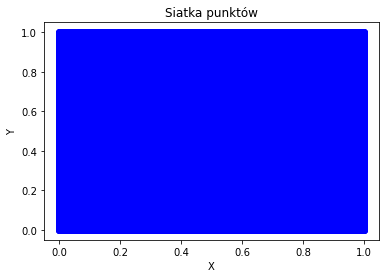

In [11]:
mesh = generate_mesh(1000)
plt.scatter(mesh [:, 0], mesh[:, 1], c='blue')
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Siatka punktów')
plt.show()

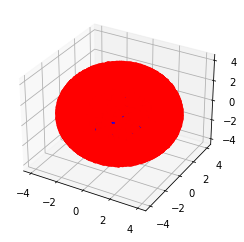

In [12]:
data, sphere, ball = one_sphere_one_ball_inside_dataset(3, 10000)
plot_two_figures(sphere, ball)

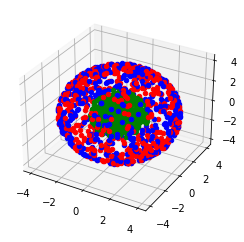

In [134]:
data, sphere, sphere2, ball = two_sphere_one_ball_inside_dataset(3, 500)
plot_three_figures(sphere, sphere2, ball)

In [6]:
def generate_points_on_sphere(N, R):
    """Generate N points on a sphere of radius R."""
    points = []
    for i in range(N):
        theta = np.random.uniform(0, 2 * np.pi)
        phi = np.arccos(np.random.uniform(-1, 1))
        x = R * np.sin(phi) * np.cos(theta)
        y = R * np.sin(phi) * np.sin(theta)
        z = R * np.cos(phi)
        points.append([x, y, z])
    return np.array(points)


def generate_points_in_sphere(N, R):
    """Generate N points in a sphere of radius R."""
    points = []
    for i in range(N):
        r = R * np.random.uniform(0, 1) ** (1 / 3)
        theta = np.random.uniform(0, 2 * np.pi)
        phi = np.arccos(np.random.uniform(-1, 1))
        x = r * np.sin(phi) * np.cos(theta)
        y = r * np.sin(phi) * np.sin(theta)
        z = r * np.cos(phi)
        points.append([x, y, z])
    return np.array(points)

In [7]:
# def plot_points(points):
#     """Plot points on a sphere."""
#     fig = plt.figure()
#     ax = fig.add_subplot(111, projection='3d')
#     ax.set_aspect("auto")
#     ax.set_xlim([-1, 1])
#     ax.set_ylim([-1, 1])
#     ax.set_zlim([-1, 1])
#     for x, y, z in points:
#         ax.scatter(x, y, z)
#     plt.show()


# def plot_two_figures(figure1, figure2):
#     """Plot points of two figures."""
#     fig = plt.figure()
#     ax = fig.add_subplot(111, projection='3d')
#     for x, y, z in figure1:
#         ax.scatter(x, y, z, c='r')
#     for x, y, z in figure2:
#         ax.scatter(x, y, z, c='b')
#     plt.show()

In [8]:
CONTAINER_NAME = 'IVHD'

In [9]:
def prepare_labels_and_data(p1, p2):
    labels = np.concatenate((np.zeros(len(p1)), np.ones(len(p2))), dtype=float)
    data = np.concatenate((p1, p2), dtype=float)

    np.savetxt('labels.csv', labels, delimiter=',', fmt='%f')
    np.savetxt('data.csv', data, delimiter=',', fmt='%f')


def upload_labels_and_data():
    !docker cp /Users/majkamiezianko/Desktop/IVHD/labels.csv "{CONTAINER_NAME}:/opt/viskit/labels.csv"
    !docker cp /Users/majkamiezianko/Desktop/IVHD/data.csv "{CONTAINER_NAME}:/opt/viskit/data.csv"


def calculate_knn_graph(nn, is_cosine_metric):
    !docker exec -it {CONTAINER_NAME} python3 "/opt/viskit/python/viskit/knn_graph/faiss_generator.py" "/opt/viskit/data.csv" {is_cosine_metric} {nn} "/opt/viskit/graph.bin"


def run_viskit(iterations, nearest_neighbors_count, random_neighbors_count, caster_name, binary_distances):
    binary_distances_int = 1 if binary_distances else 0
    reverse_neighbors_steps = 0
    reverse_neighbors_count = 0
    l1_steps = 0

    !docker exec -it {CONTAINER_NAME} "/opt/viskit/viskit_offline/viskit_offline" "/opt/viskit/data.csv" "/opt/viskit/labels.csv" "/opt/viskit/graph.bin" "/opt/viskit/output.csv" {iterations} {nearest_neighbors_count} {random_neighbors_count} {binary_distances_int} {reverse_neighbors_steps} {reverse_neighbors_count} {l1_steps} {caster_name}


def load_viskit_output():
    !docker cp "{CONTAINER_NAME}:/opt/viskit/output.csv" /Users/majkamiezianko/Desktop/IVHD/output.csv
    output = np.loadtxt('/Users/majkamiezianko/Desktop/IVHD/output.csv', delimiter=',')
    return output


def cleanup():
    !docker exec -it {CONTAINER_NAME} rm "/opt/viskit/data.csv" "/opt/viskit/labels.csv" "/opt/viskit/graph.bin" "/opt/viskit/output.csv"
    !rm data.csv labels.csv output.csv

In [30]:
from IPython.utils import io


def ivhd(iterations=2500, nearest_neighbors_count=2, random_neighbors_count=1, caster_name="force-directed",
         graph_nn=100, graph_is_cosine_metric=True, capture_output=True, return_result=False, plot_result=True,
         binary_distances=False, plot_name=None):
    def run_ihvd():
#         prepare_labels_and_data(p1, p2)
        upload_labels_and_data()
        calculate_knn_graph(graph_nn, graph_is_cosine_metric)
        run_viskit(iterations, nearest_neighbors_count, random_neighbors_count, caster_name, binary_distances)
        result = load_viskit_output()
        cleanup()
        return result

    if capture_output:
        with io.capture_output() as _:
            output = run_ihvd()
    else:
        output = run_ihvd()

    if plot_result:
        
        #visualisation
        sns.scatterplot(x=output[:, 0], y=output[:, 1], hue=output[:, 2], legend='full', s=3)
        plt.xlabel('IVHD Dimension 1', fontsize=14)
        plt.ylabel('IVHD Dimension 2', fontsize=14)
        plt.title(plot_name, fontsize=18)
        
        
        
        
        #shepard diagram
        ivhd_embedding = pd.read_csv("/Users/majkamiezianko/Desktop/IVHD/output.csv")
        df_data_full = pd.read_csv("/Users/majkamiezianko/Desktop/IVHD/data.csv")
        df_labels_full = pd.read_csv("/Users/majkamiezianko/Desktop/IVHD/labels.csv")


        ivhd_euclidean_diagram = ShepardDiagram(df_data_full, ivhd_embedding.iloc[:,:2], df_labels_full)
        ivhd_euclidean_diagram.calculate()
        fig = plt.figure(figsize=(10, 10), constrained_layout=True)
        spec = fig.add_gridspec(3, 2)

        ax00 = fig.add_subplot(spec[0, 0])
        draw_diagram(ivhd_euclidean_diagram.original_distances,ivhd_euclidean_diagram.embedding_distances,'IVHD', ax00)

    

    if return_result:
        return output


ShepardDiagram calculation took 0.01 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


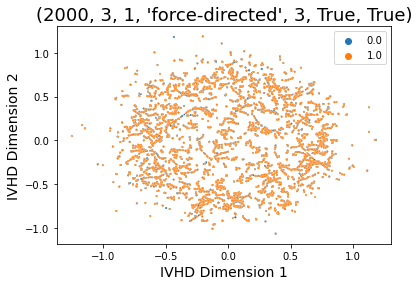

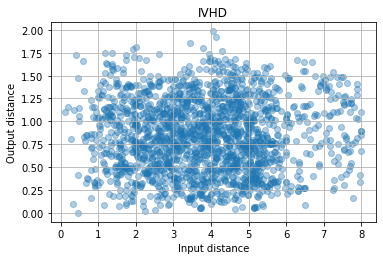

Plot for parameters: (2000, 3, 1, 'force-directed', 3, True, True)
ShepardDiagram calculation took 0.00 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


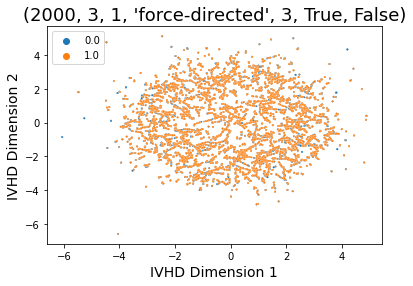

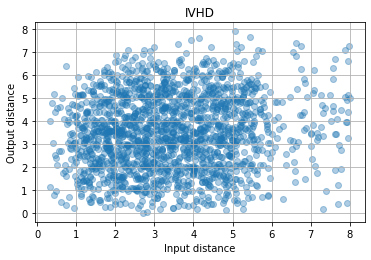

Plot for parameters: (2000, 3, 1, 'force-directed', 3, True, False)
ShepardDiagram calculation took 0.01 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


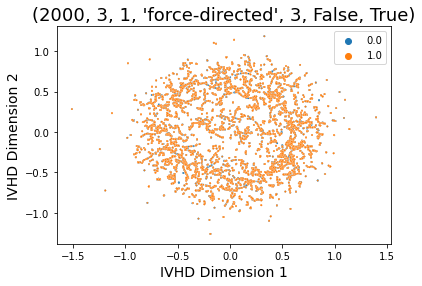

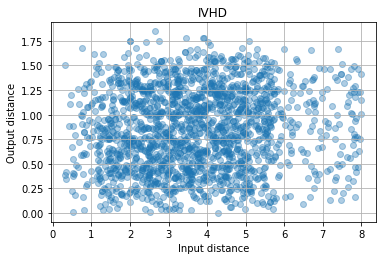

Plot for parameters: (2000, 3, 1, 'force-directed', 3, False, True)
ShepardDiagram calculation took 0.00 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


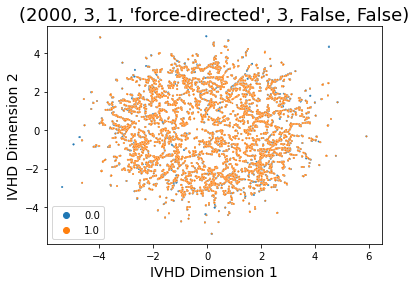

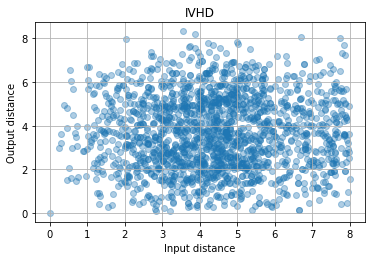

Plot for parameters: (2000, 3, 1, 'force-directed', 3, False, False)
ShepardDiagram calculation took 0.01 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


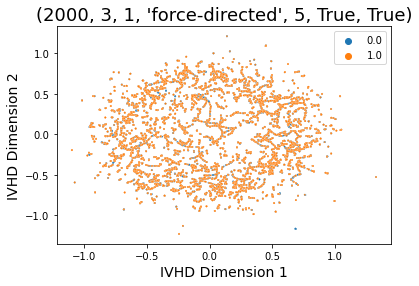

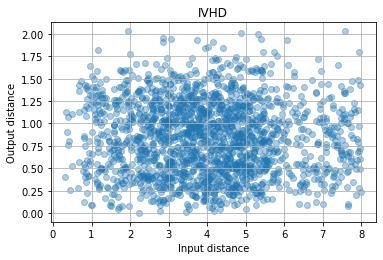

Plot for parameters: (2000, 3, 1, 'force-directed', 5, True, True)
ShepardDiagram calculation took 0.01 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


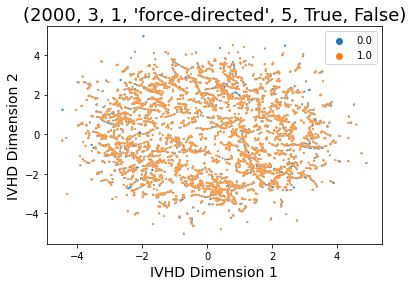

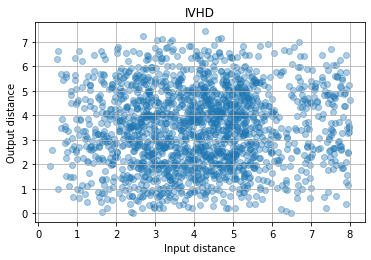

Plot for parameters: (2000, 3, 1, 'force-directed', 5, True, False)
ShepardDiagram calculation took 0.01 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


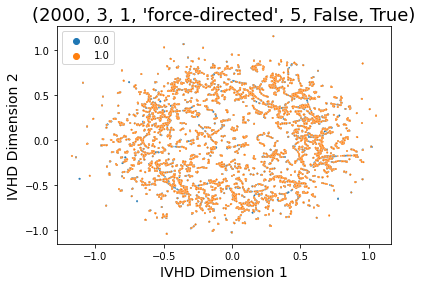

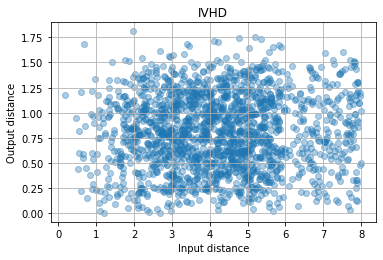

Plot for parameters: (2000, 3, 1, 'force-directed', 5, False, True)
ShepardDiagram calculation took 0.00 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


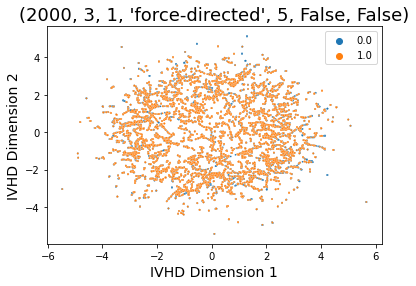

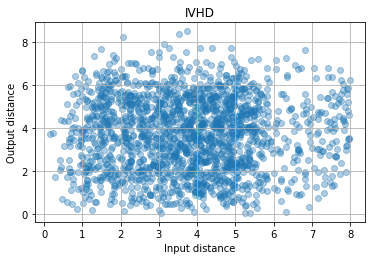

Plot for parameters: (2000, 3, 1, 'force-directed', 5, False, False)
ShepardDiagram calculation took 0.01 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


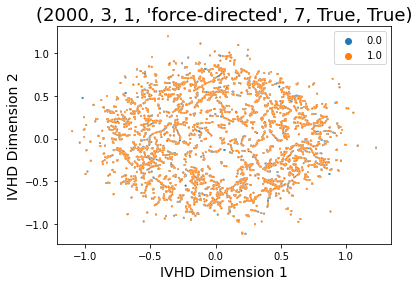

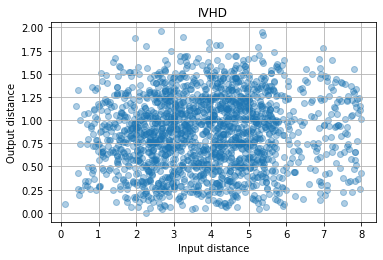

Plot for parameters: (2000, 3, 1, 'force-directed', 7, True, True)
ShepardDiagram calculation took 0.00 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


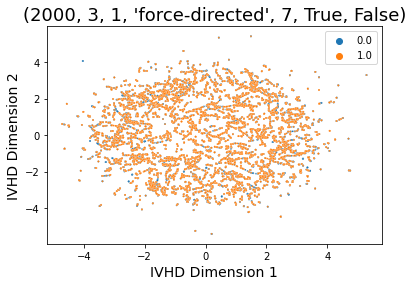

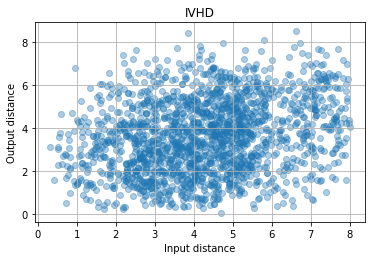

Plot for parameters: (2000, 3, 1, 'force-directed', 7, True, False)
ShepardDiagram calculation took 0.00 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


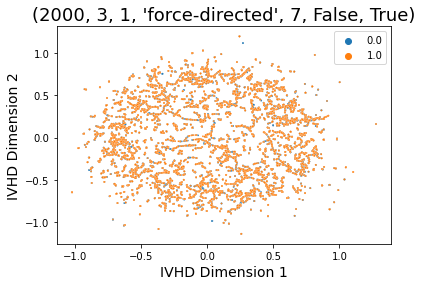

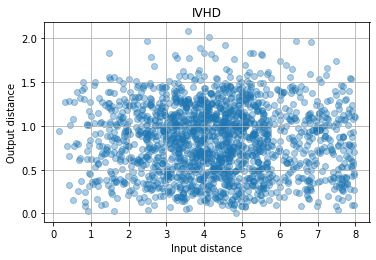

Plot for parameters: (2000, 3, 1, 'force-directed', 7, False, True)
ShepardDiagram calculation took 0.01 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


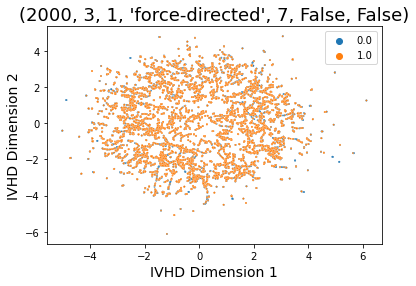

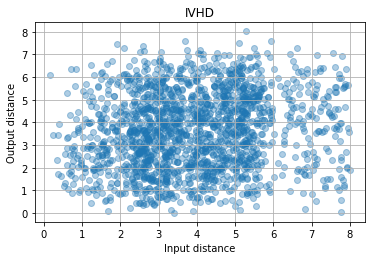

Plot for parameters: (2000, 3, 1, 'force-directed', 7, False, False)
ShepardDiagram calculation took 0.01 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


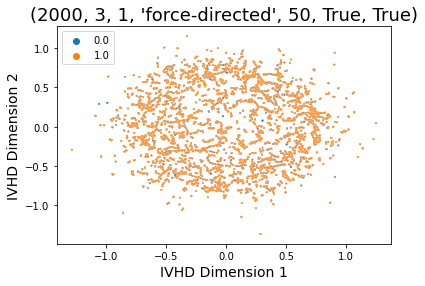

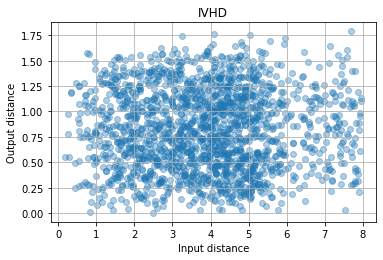

Plot for parameters: (2000, 3, 1, 'force-directed', 50, True, True)
ShepardDiagram calculation took 0.01 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


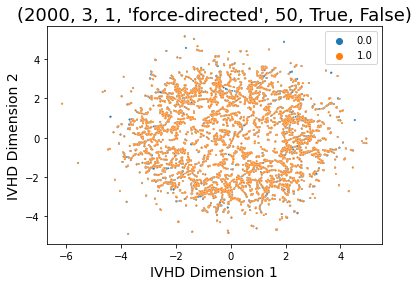

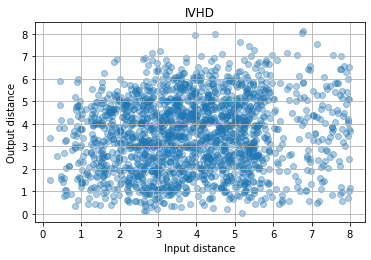

Plot for parameters: (2000, 3, 1, 'force-directed', 50, True, False)
ShepardDiagram calculation took 0.01 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


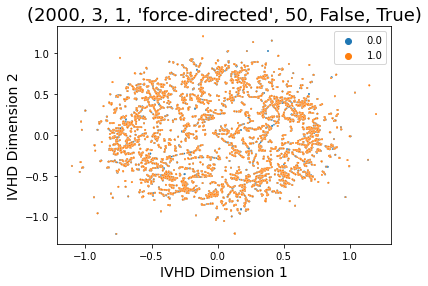

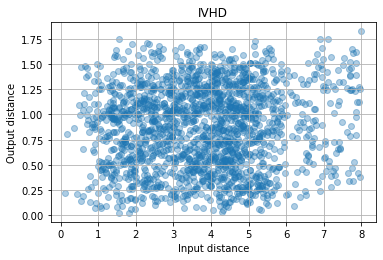

Plot for parameters: (2000, 3, 1, 'force-directed', 50, False, True)
ShepardDiagram calculation took 0.00 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


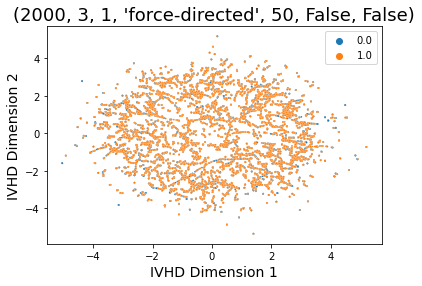

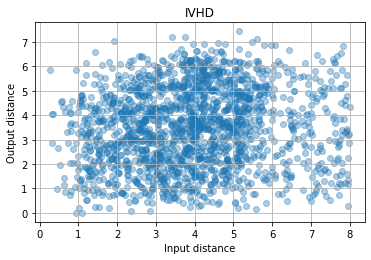

Plot for parameters: (2000, 3, 1, 'force-directed', 50, False, False)
ShepardDiagram calculation took 0.00 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


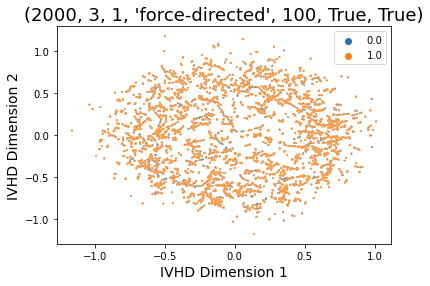

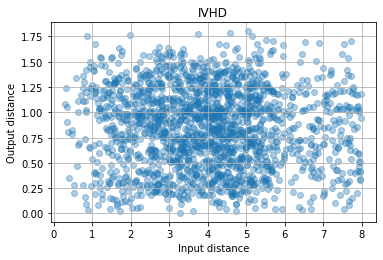

Plot for parameters: (2000, 3, 1, 'force-directed', 100, True, True)
ShepardDiagram calculation took 0.01 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


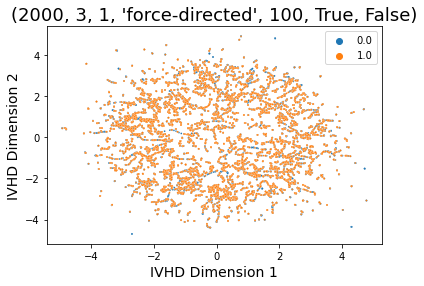

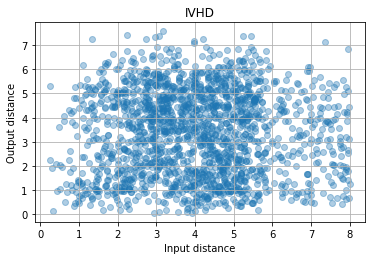

Plot for parameters: (2000, 3, 1, 'force-directed', 100, True, False)
ShepardDiagram calculation took 0.01 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


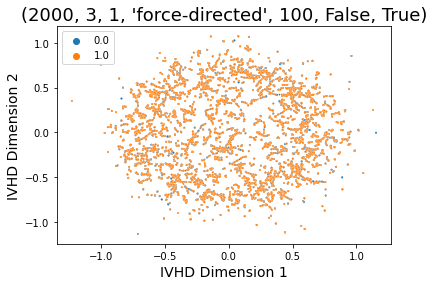

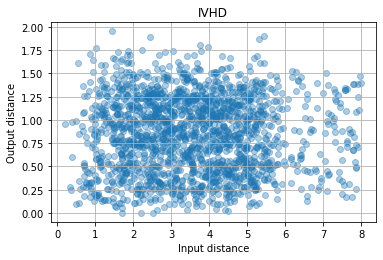

Plot for parameters: (2000, 3, 1, 'force-directed', 100, False, True)
ShepardDiagram calculation took 0.01 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


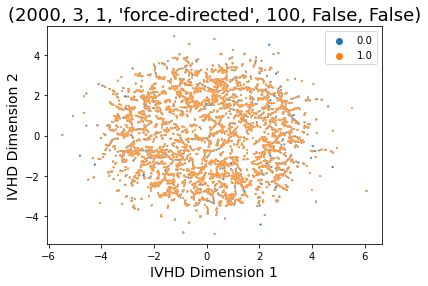

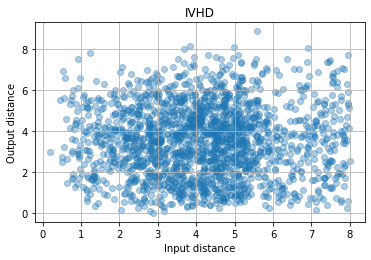

Plot for parameters: (2000, 3, 1, 'force-directed', 100, False, False)
ShepardDiagram calculation took 0.01 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


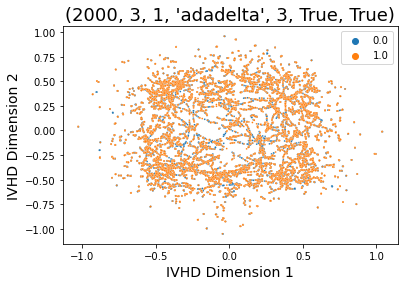

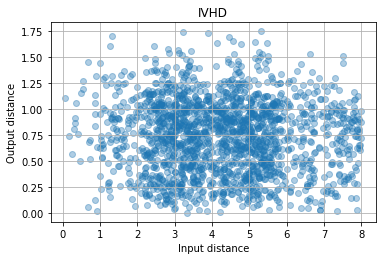

Plot for parameters: (2000, 3, 1, 'adadelta', 3, True, True)
ShepardDiagram calculation took 0.00 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


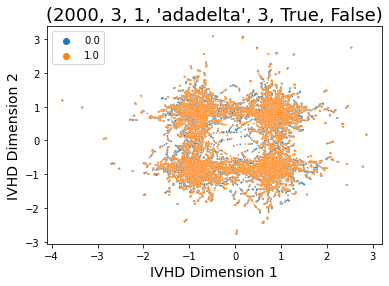

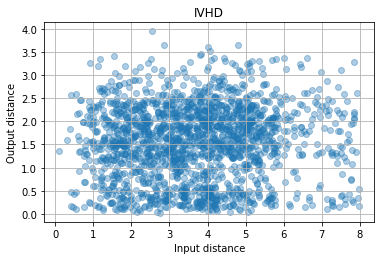

Plot for parameters: (2000, 3, 1, 'adadelta', 3, True, False)
ShepardDiagram calculation took 0.01 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


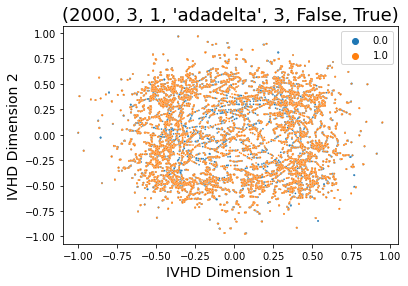

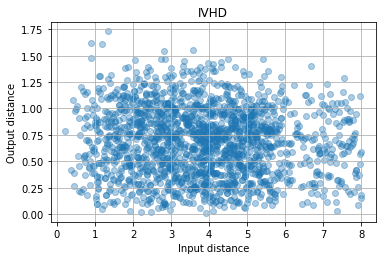

Plot for parameters: (2000, 3, 1, 'adadelta', 3, False, True)
ShepardDiagram calculation took 0.00 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


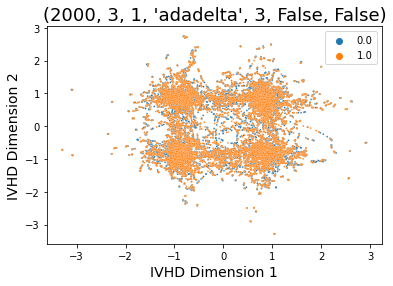

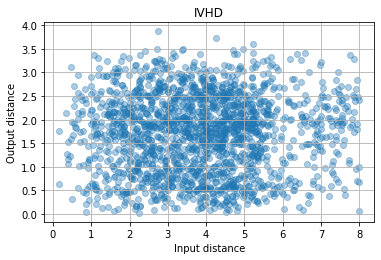

Plot for parameters: (2000, 3, 1, 'adadelta', 3, False, False)
ShepardDiagram calculation took 0.01 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


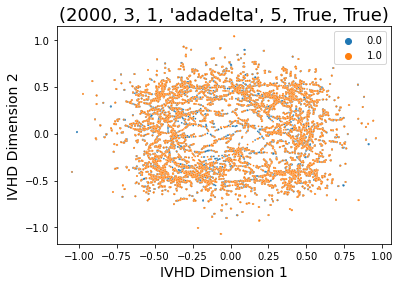

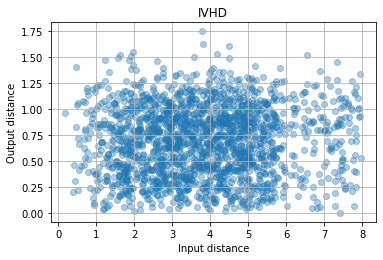

Plot for parameters: (2000, 3, 1, 'adadelta', 5, True, True)
ShepardDiagram calculation took 0.00 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


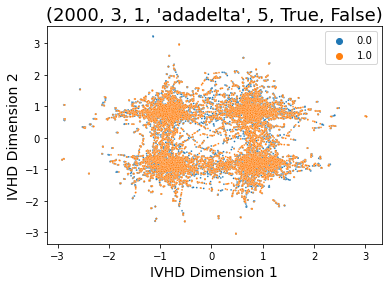

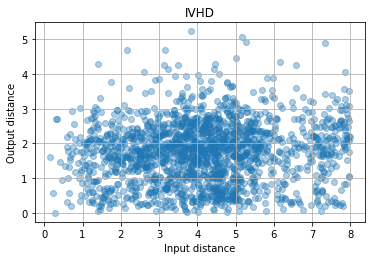

Plot for parameters: (2000, 3, 1, 'adadelta', 5, True, False)
ShepardDiagram calculation took 0.00 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


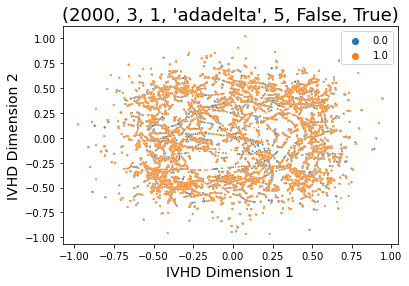

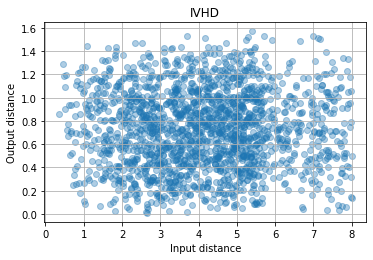

Plot for parameters: (2000, 3, 1, 'adadelta', 5, False, True)
ShepardDiagram calculation took 0.00 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


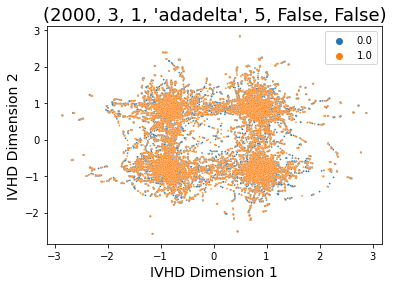

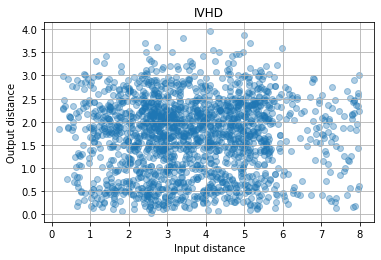

Plot for parameters: (2000, 3, 1, 'adadelta', 5, False, False)
ShepardDiagram calculation took 0.00 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


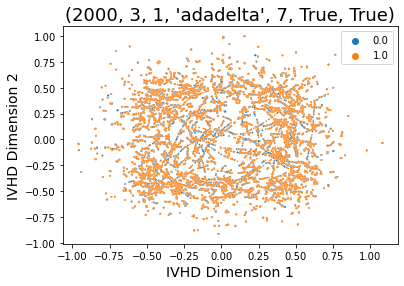

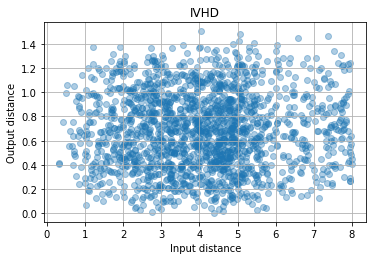

Plot for parameters: (2000, 3, 1, 'adadelta', 7, True, True)
ShepardDiagram calculation took 0.01 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


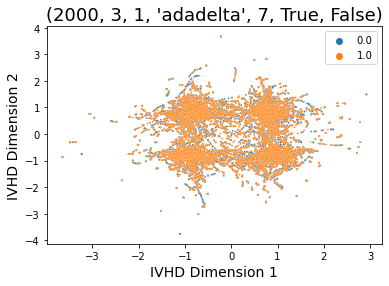

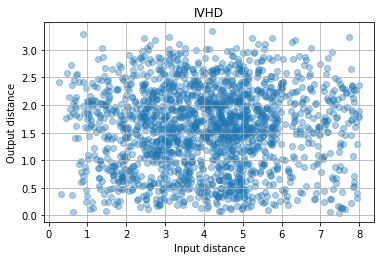

Plot for parameters: (2000, 3, 1, 'adadelta', 7, True, False)
ShepardDiagram calculation took 0.01 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


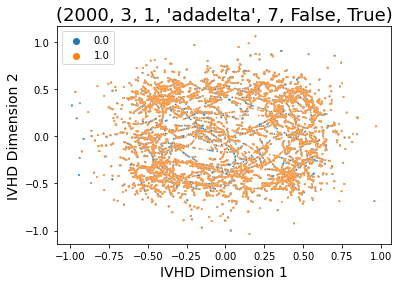

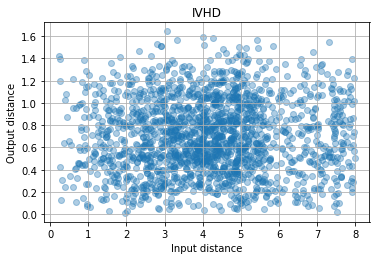

Plot for parameters: (2000, 3, 1, 'adadelta', 7, False, True)
ShepardDiagram calculation took 0.00 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


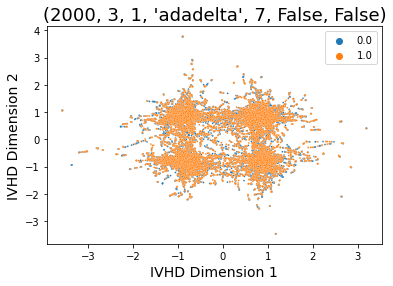

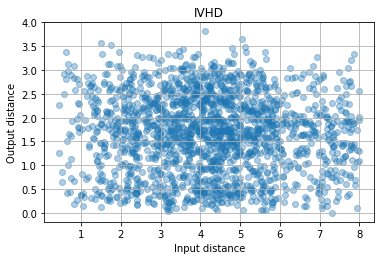

Plot for parameters: (2000, 3, 1, 'adadelta', 7, False, False)
ShepardDiagram calculation took 0.01 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


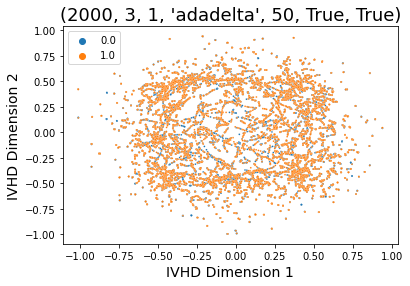

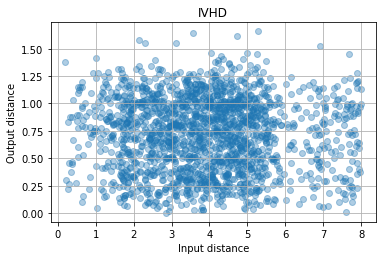

Plot for parameters: (2000, 3, 1, 'adadelta', 50, True, True)
ShepardDiagram calculation took 0.00 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


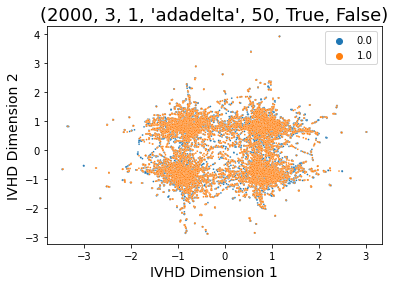

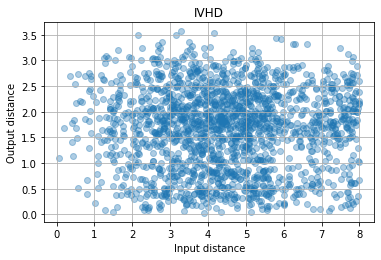

Plot for parameters: (2000, 3, 1, 'adadelta', 50, True, False)
ShepardDiagram calculation took 0.00 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


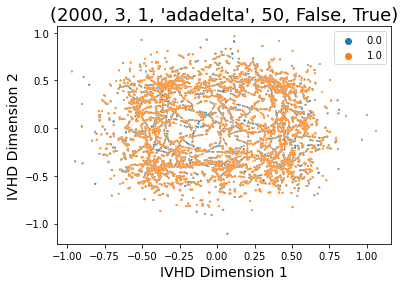

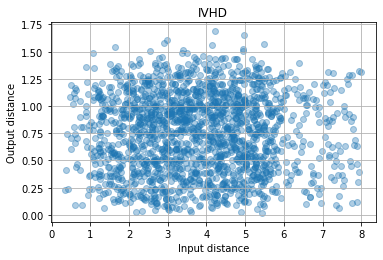

Plot for parameters: (2000, 3, 1, 'adadelta', 50, False, True)
ShepardDiagram calculation took 0.01 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


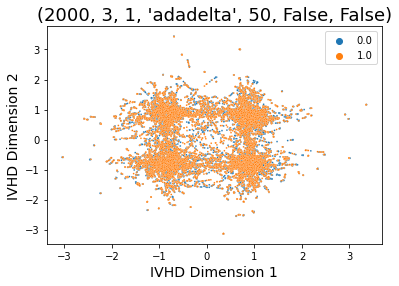

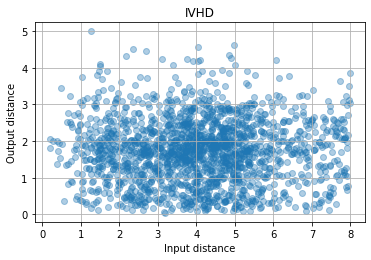

Plot for parameters: (2000, 3, 1, 'adadelta', 50, False, False)
ShepardDiagram calculation took 0.00 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


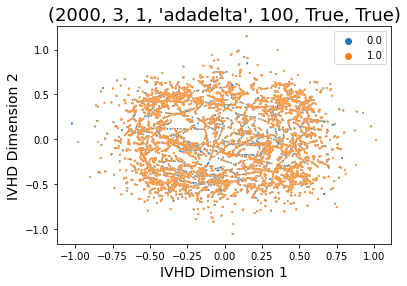

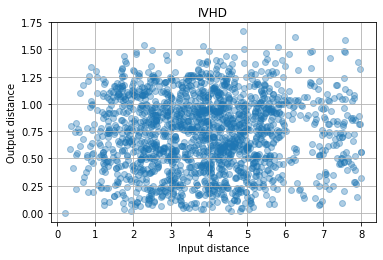

Plot for parameters: (2000, 3, 1, 'adadelta', 100, True, True)
ShepardDiagram calculation took 0.01 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


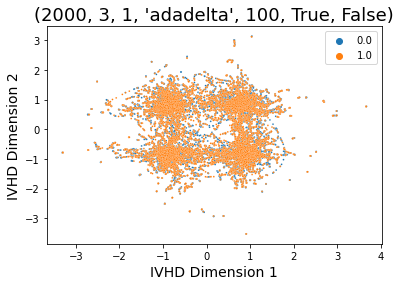

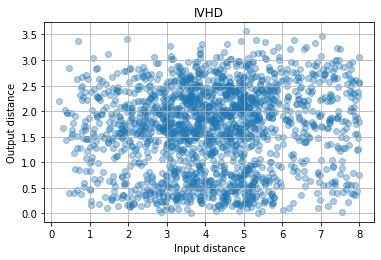

Plot for parameters: (2000, 3, 1, 'adadelta', 100, True, False)
ShepardDiagram calculation took 0.00 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


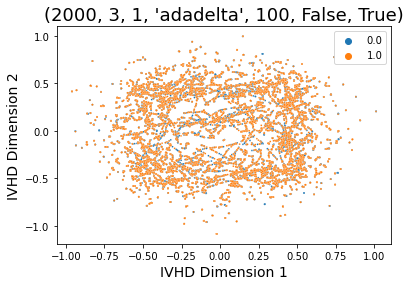

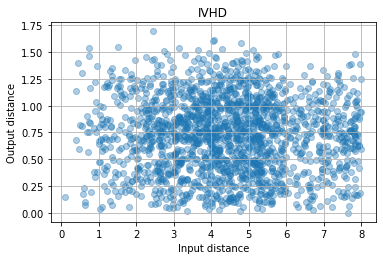

Plot for parameters: (2000, 3, 1, 'adadelta', 100, False, True)
ShepardDiagram calculation took 0.01 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


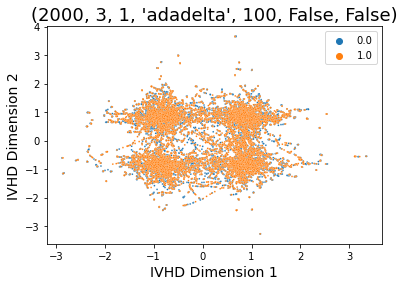

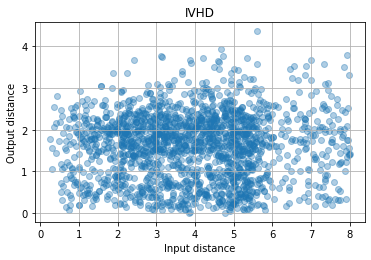

Plot for parameters: (2000, 3, 1, 'adadelta', 100, False, False)
ShepardDiagram calculation took 0.00 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


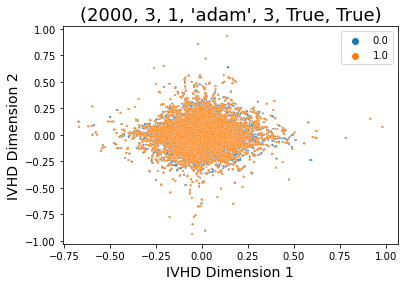

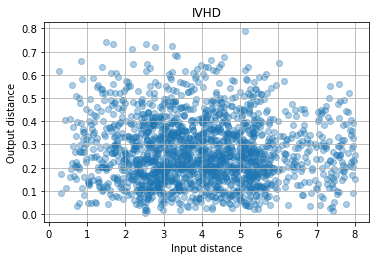

Plot for parameters: (2000, 3, 1, 'adam', 3, True, True)
ShepardDiagram calculation took 0.00 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


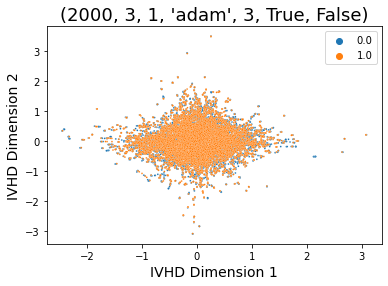

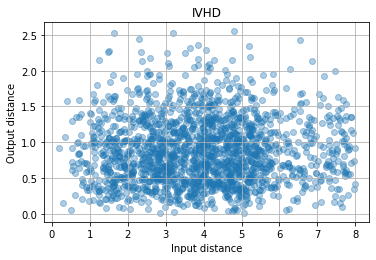

Plot for parameters: (2000, 3, 1, 'adam', 3, True, False)
ShepardDiagram calculation took 0.00 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


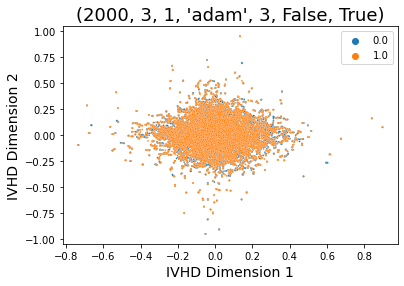

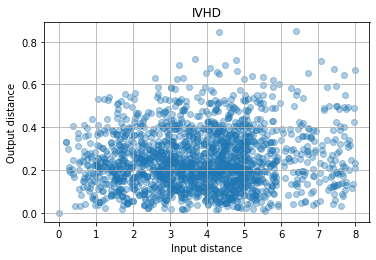

Plot for parameters: (2000, 3, 1, 'adam', 3, False, True)
ShepardDiagram calculation took 0.02 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


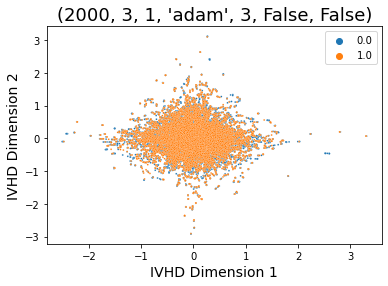

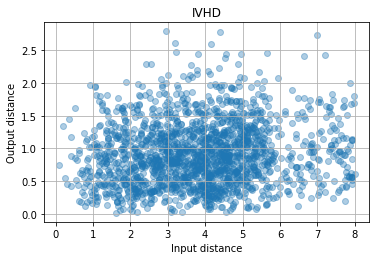

Plot for parameters: (2000, 3, 1, 'adam', 3, False, False)
ShepardDiagram calculation took 0.01 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


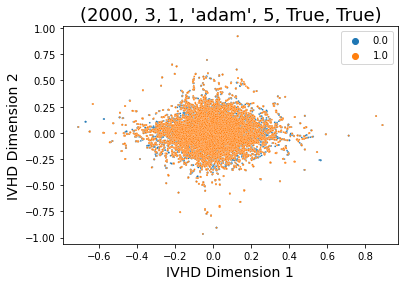

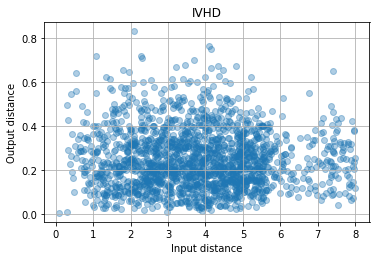

Plot for parameters: (2000, 3, 1, 'adam', 5, True, True)
ShepardDiagram calculation took 0.01 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


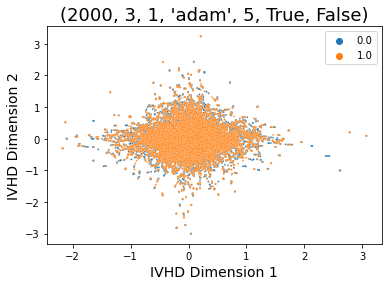

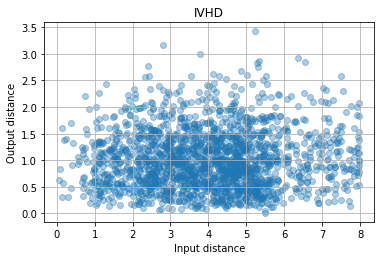

Plot for parameters: (2000, 3, 1, 'adam', 5, True, False)
ShepardDiagram calculation took 0.01 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


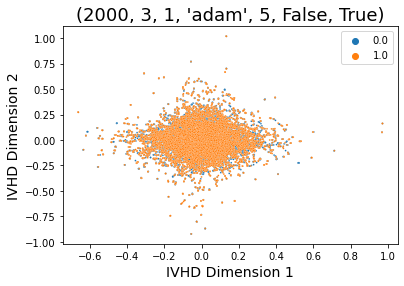

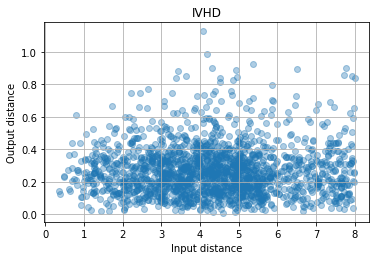

Plot for parameters: (2000, 3, 1, 'adam', 5, False, True)
ShepardDiagram calculation took 0.04 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


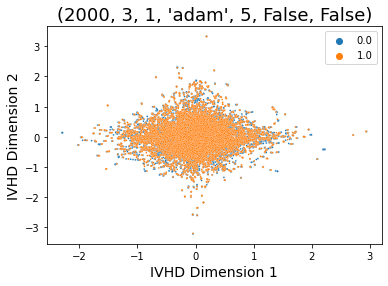

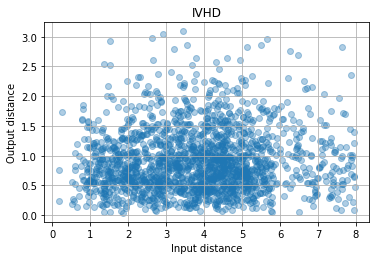

Plot for parameters: (2000, 3, 1, 'adam', 5, False, False)
ShepardDiagram calculation took 0.03 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


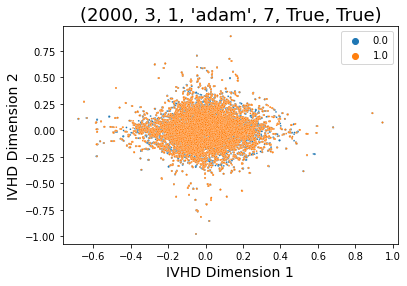

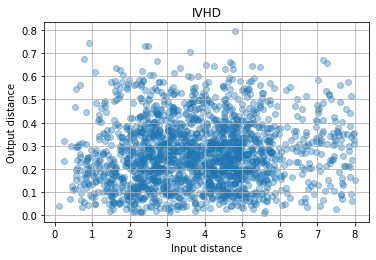

Plot for parameters: (2000, 3, 1, 'adam', 7, True, True)
ShepardDiagram calculation took 0.02 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


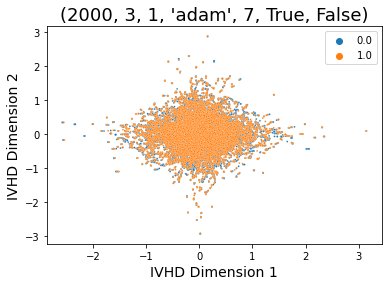

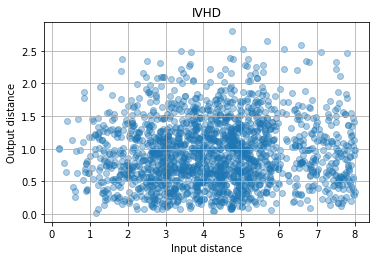

Plot for parameters: (2000, 3, 1, 'adam', 7, True, False)
ShepardDiagram calculation took 0.01 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


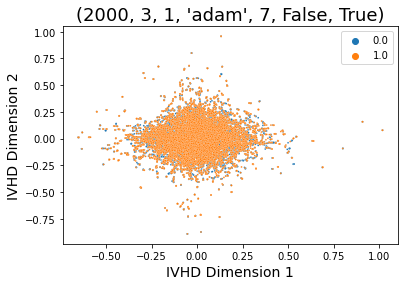

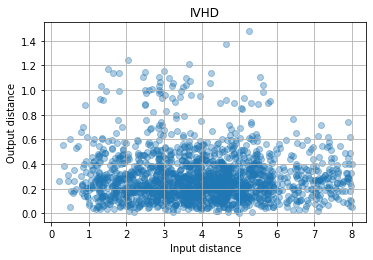

Plot for parameters: (2000, 3, 1, 'adam', 7, False, True)
ShepardDiagram calculation took 0.01 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


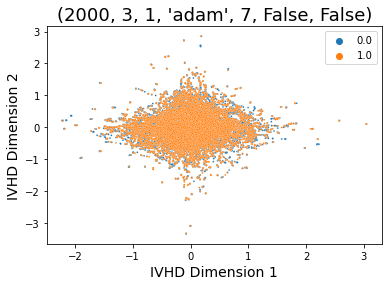

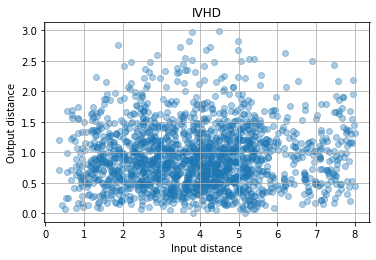

Plot for parameters: (2000, 3, 1, 'adam', 7, False, False)
ShepardDiagram calculation took 0.02 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


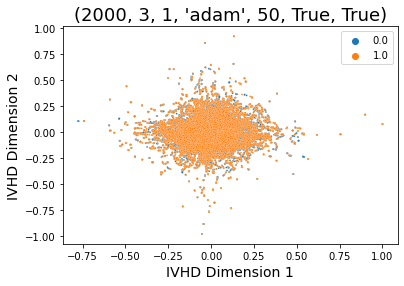

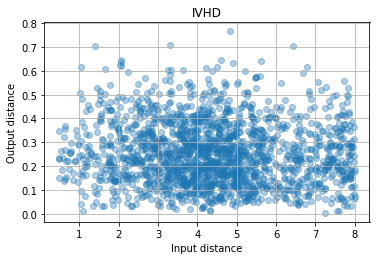

Plot for parameters: (2000, 3, 1, 'adam', 50, True, True)
ShepardDiagram calculation took 0.01 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


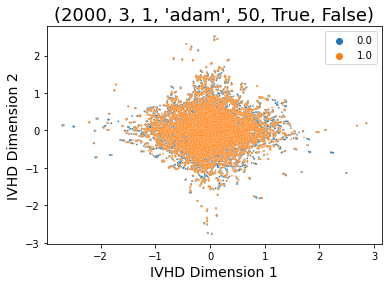

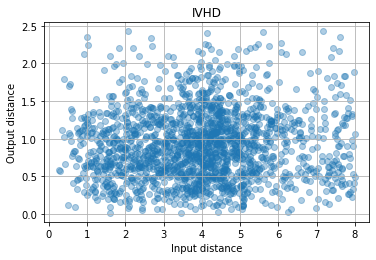

Plot for parameters: (2000, 3, 1, 'adam', 50, True, False)
ShepardDiagram calculation took 0.01 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


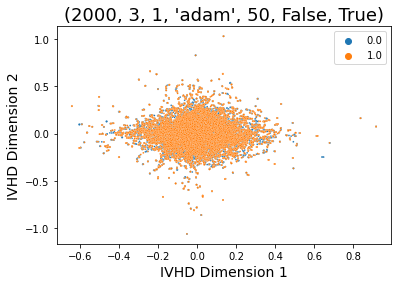

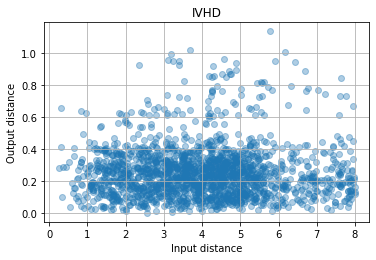

Plot for parameters: (2000, 3, 1, 'adam', 50, False, True)
ShepardDiagram calculation took 0.00 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


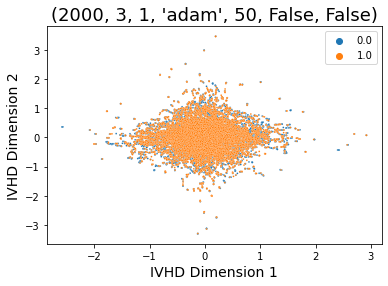

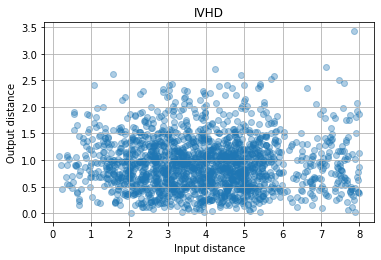

Plot for parameters: (2000, 3, 1, 'adam', 50, False, False)
ShepardDiagram calculation took 0.01 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


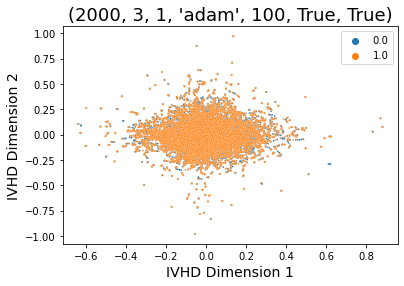

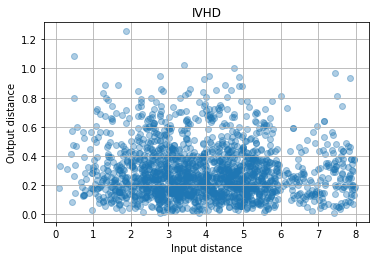

Plot for parameters: (2000, 3, 1, 'adam', 100, True, True)
ShepardDiagram calculation took 0.00 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


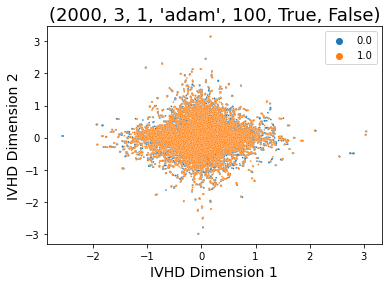

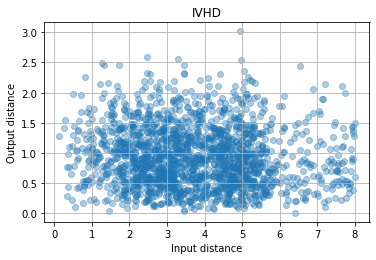

Plot for parameters: (2000, 3, 1, 'adam', 100, True, False)
ShepardDiagram calculation took 0.00 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


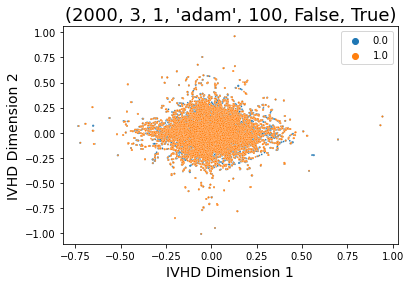

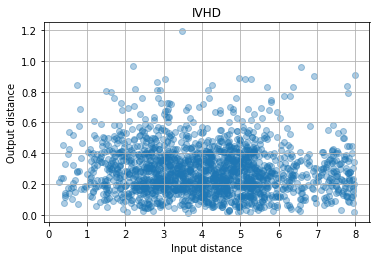

Plot for parameters: (2000, 3, 1, 'adam', 100, False, True)
ShepardDiagram calculation took 0.01 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


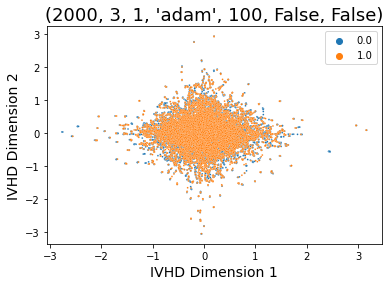

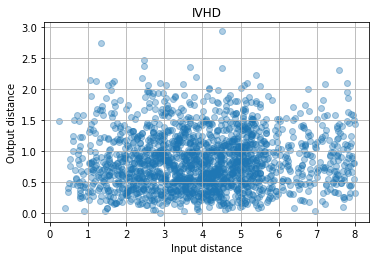

Plot for parameters: (2000, 3, 1, 'adam', 100, False, False)
ShepardDiagram calculation took 0.01 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


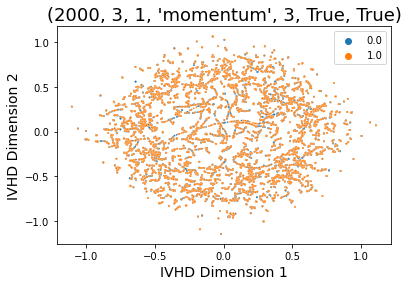

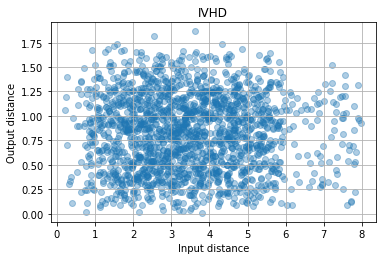

Plot for parameters: (2000, 3, 1, 'momentum', 3, True, True)
ShepardDiagram calculation took 0.01 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


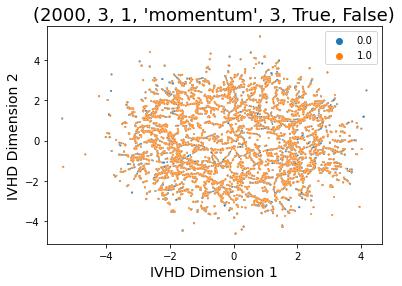

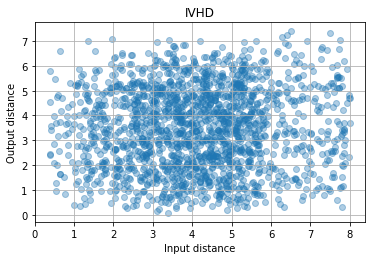

Plot for parameters: (2000, 3, 1, 'momentum', 3, True, False)
ShepardDiagram calculation took 0.00 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


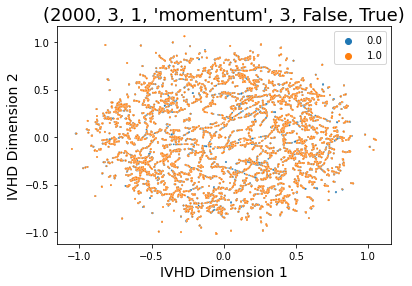

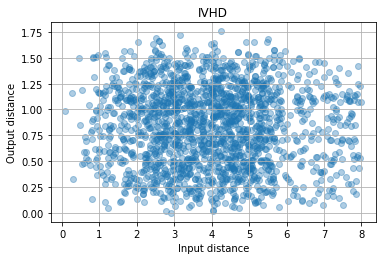

Plot for parameters: (2000, 3, 1, 'momentum', 3, False, True)
ShepardDiagram calculation took 0.00 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


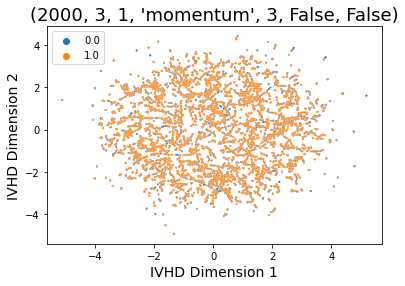

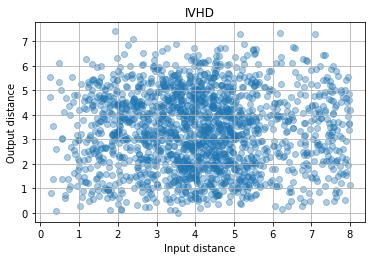

Plot for parameters: (2000, 3, 1, 'momentum', 3, False, False)
ShepardDiagram calculation took 0.01 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


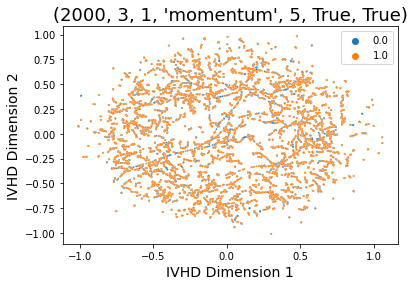

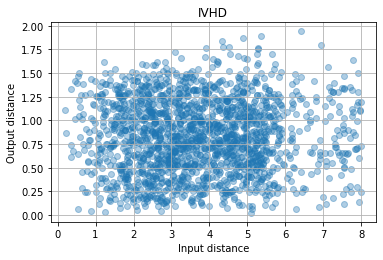

Plot for parameters: (2000, 3, 1, 'momentum', 5, True, True)
ShepardDiagram calculation took 0.01 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


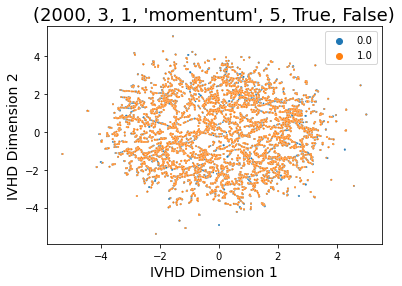

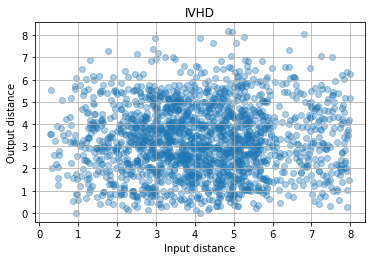

Plot for parameters: (2000, 3, 1, 'momentum', 5, True, False)
ShepardDiagram calculation took 0.01 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


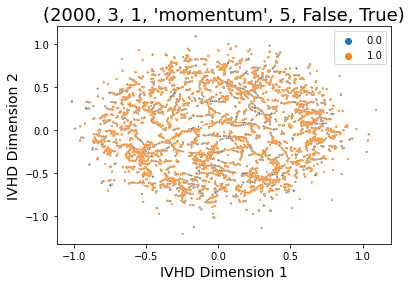

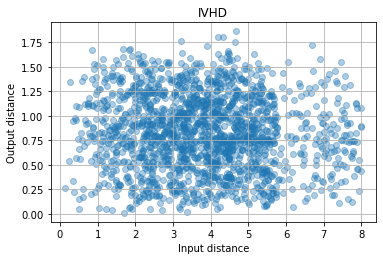

Plot for parameters: (2000, 3, 1, 'momentum', 5, False, True)
ShepardDiagram calculation took 0.00 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


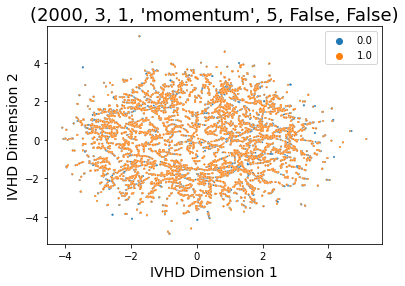

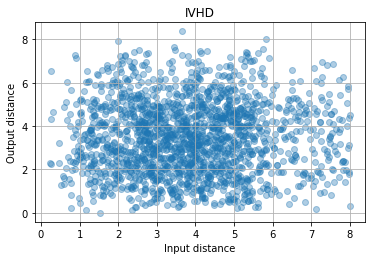

Plot for parameters: (2000, 3, 1, 'momentum', 5, False, False)
ShepardDiagram calculation took 0.01 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


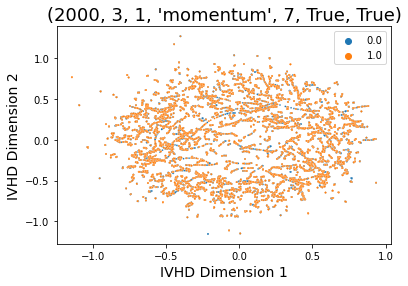

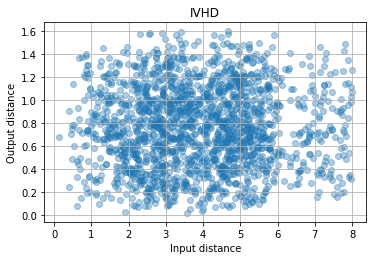

Plot for parameters: (2000, 3, 1, 'momentum', 7, True, True)
ShepardDiagram calculation took 0.01 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


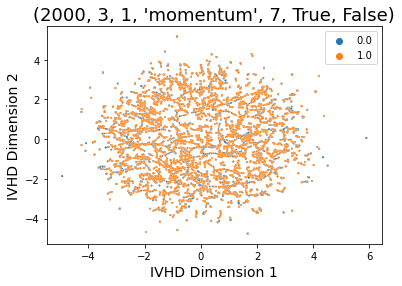

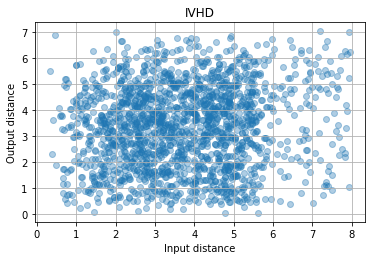

Plot for parameters: (2000, 3, 1, 'momentum', 7, True, False)
ShepardDiagram calculation took 0.01 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


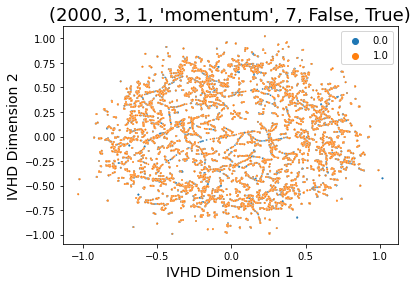

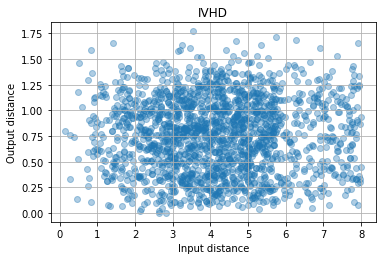

Plot for parameters: (2000, 3, 1, 'momentum', 7, False, True)
ShepardDiagram calculation took 0.01 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


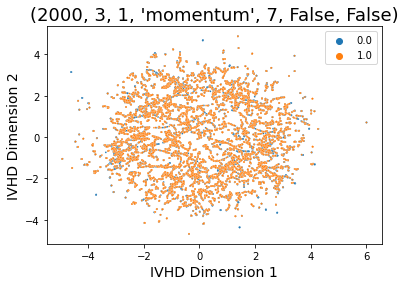

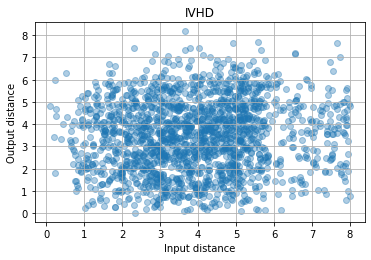

Plot for parameters: (2000, 3, 1, 'momentum', 7, False, False)
ShepardDiagram calculation took 0.01 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


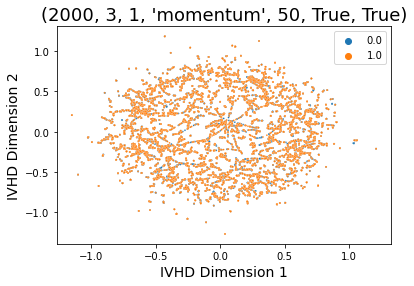

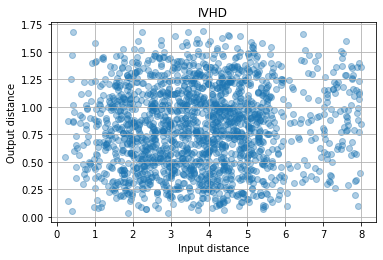

Plot for parameters: (2000, 3, 1, 'momentum', 50, True, True)
ShepardDiagram calculation took 0.01 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


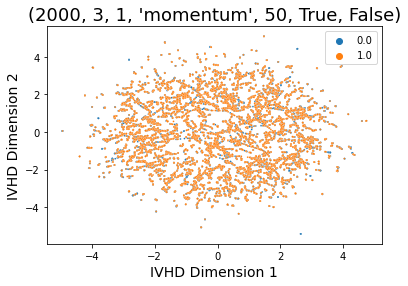

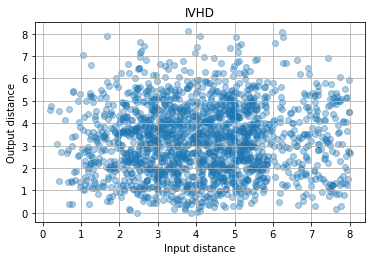

Plot for parameters: (2000, 3, 1, 'momentum', 50, True, False)
ShepardDiagram calculation took 0.01 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


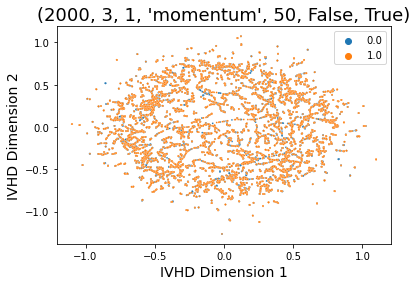

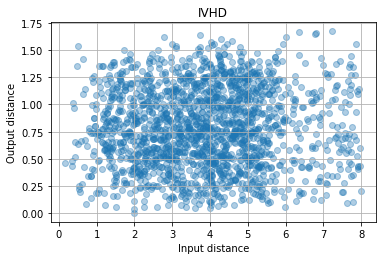

Plot for parameters: (2000, 3, 1, 'momentum', 50, False, True)
ShepardDiagram calculation took 0.01 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


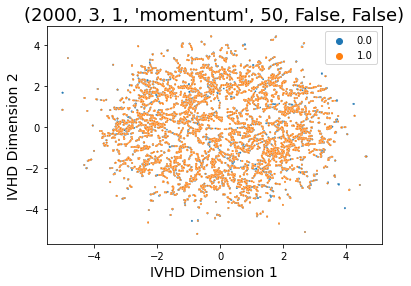

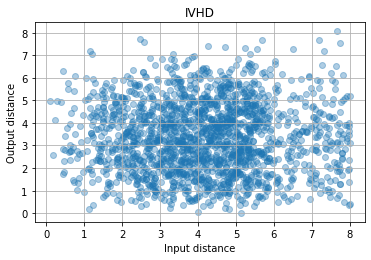

Plot for parameters: (2000, 3, 1, 'momentum', 50, False, False)
ShepardDiagram calculation took 0.01 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


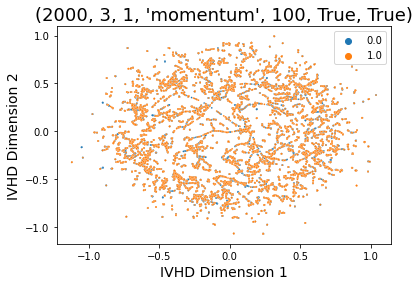

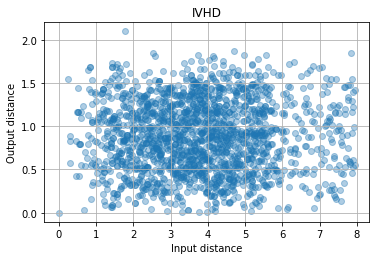

Plot for parameters: (2000, 3, 1, 'momentum', 100, True, True)
ShepardDiagram calculation took 0.01 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


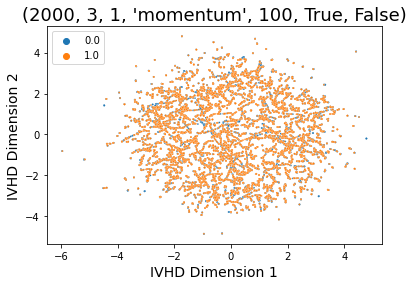

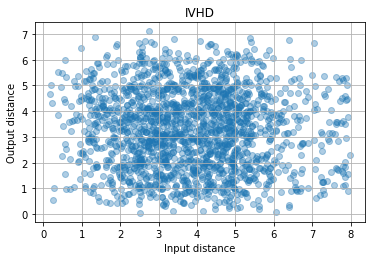

Plot for parameters: (2000, 3, 1, 'momentum', 100, True, False)
ShepardDiagram calculation took 0.01 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


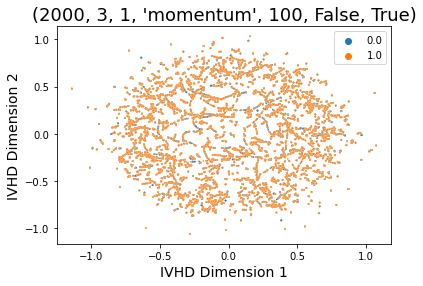

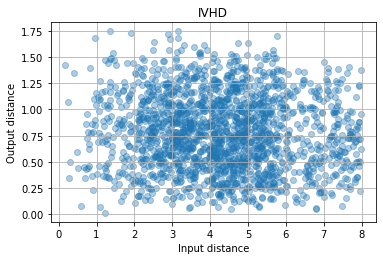

Plot for parameters: (2000, 3, 1, 'momentum', 100, False, True)
ShepardDiagram calculation took 0.01 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


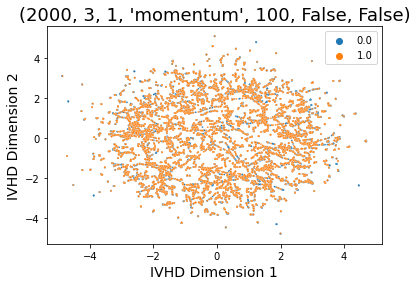

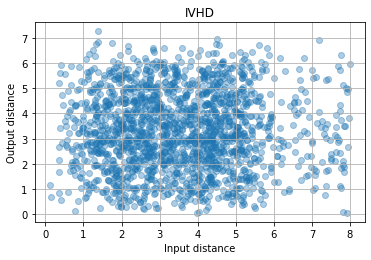

Plot for parameters: (2000, 3, 1, 'momentum', 100, False, False)
ShepardDiagram calculation took 0.01 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


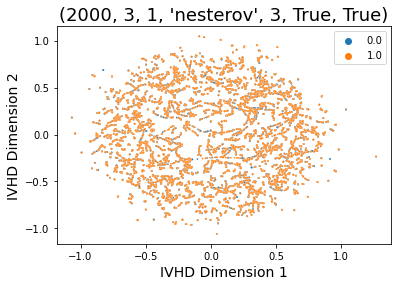

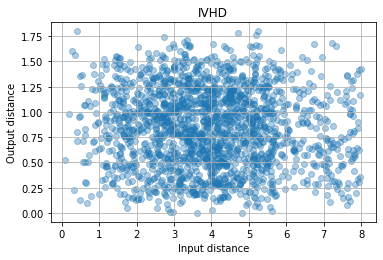

Plot for parameters: (2000, 3, 1, 'nesterov', 3, True, True)
ShepardDiagram calculation took 0.01 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


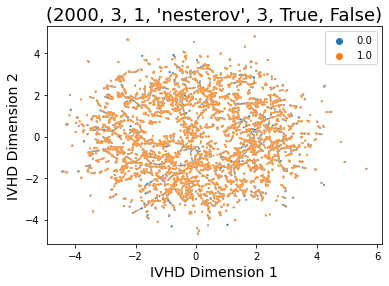

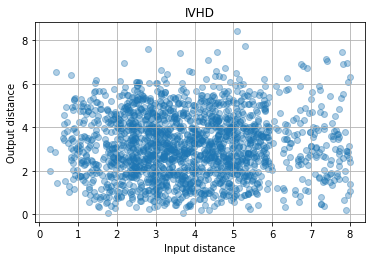

Plot for parameters: (2000, 3, 1, 'nesterov', 3, True, False)
ShepardDiagram calculation took 0.00 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


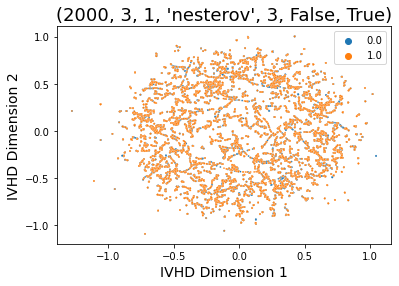

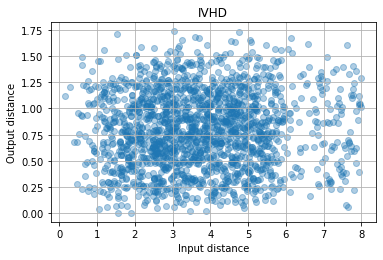

Plot for parameters: (2000, 3, 1, 'nesterov', 3, False, True)
ShepardDiagram calculation took 0.01 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


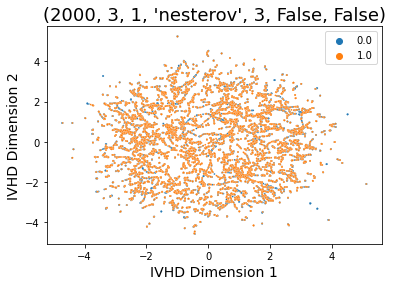

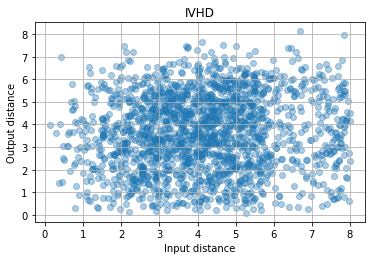

Plot for parameters: (2000, 3, 1, 'nesterov', 3, False, False)
ShepardDiagram calculation took 0.02 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


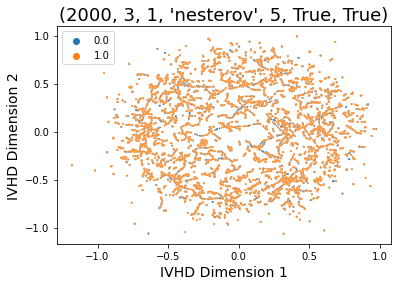

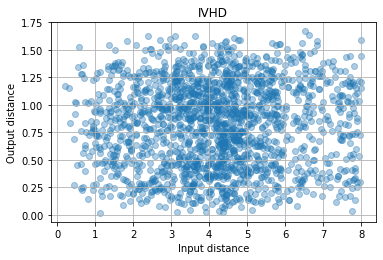

Plot for parameters: (2000, 3, 1, 'nesterov', 5, True, True)
ShepardDiagram calculation took 0.01 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


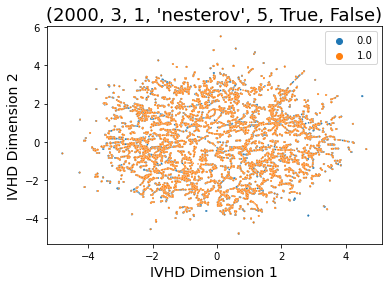

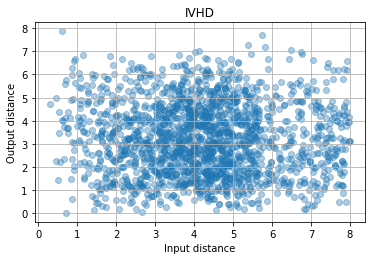

Plot for parameters: (2000, 3, 1, 'nesterov', 5, True, False)
ShepardDiagram calculation took 0.01 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


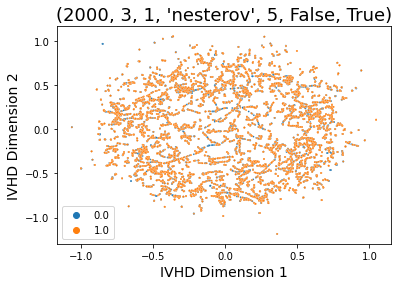

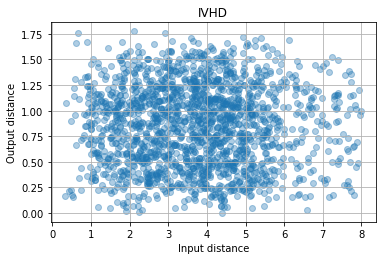

Plot for parameters: (2000, 3, 1, 'nesterov', 5, False, True)
ShepardDiagram calculation took 0.01 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


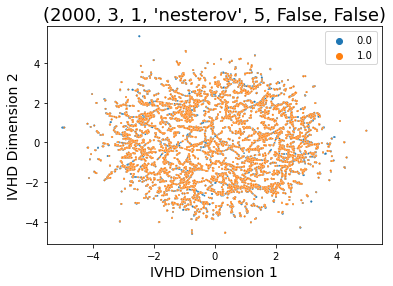

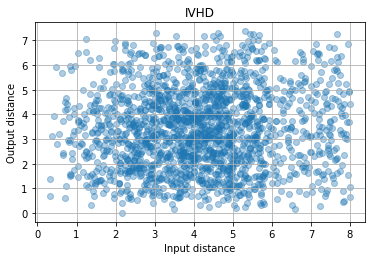

Plot for parameters: (2000, 3, 1, 'nesterov', 5, False, False)
ShepardDiagram calculation took 0.01 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


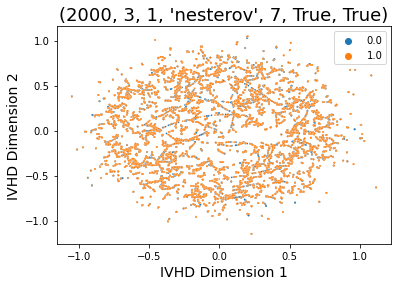

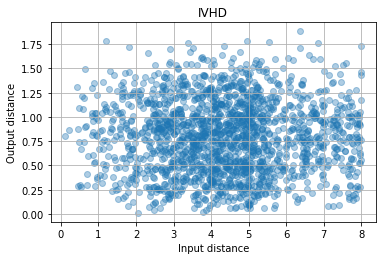

Plot for parameters: (2000, 3, 1, 'nesterov', 7, True, True)
ShepardDiagram calculation took 0.01 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


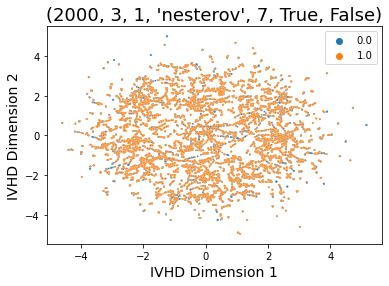

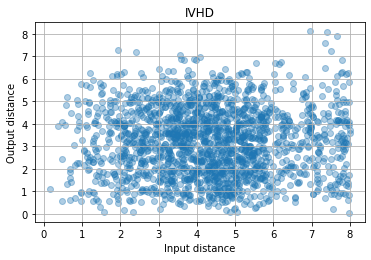

Plot for parameters: (2000, 3, 1, 'nesterov', 7, True, False)
ShepardDiagram calculation took 0.01 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


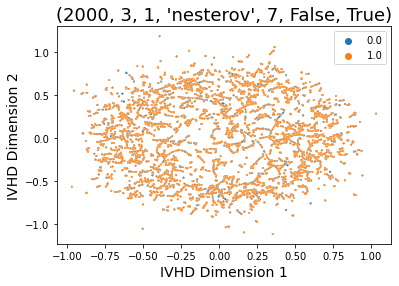

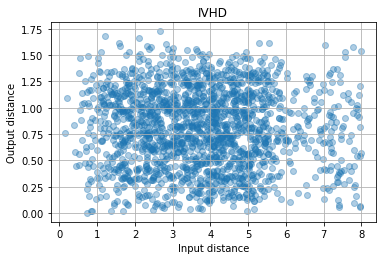

Plot for parameters: (2000, 3, 1, 'nesterov', 7, False, True)
ShepardDiagram calculation took 0.00 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


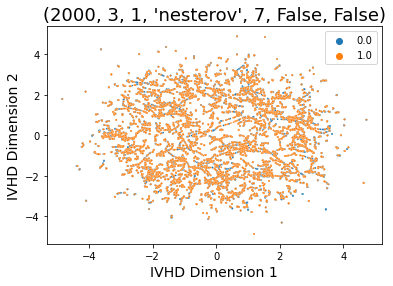

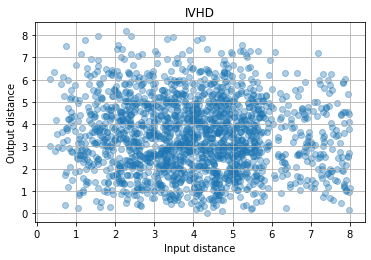

Plot for parameters: (2000, 3, 1, 'nesterov', 7, False, False)
ShepardDiagram calculation took 0.01 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


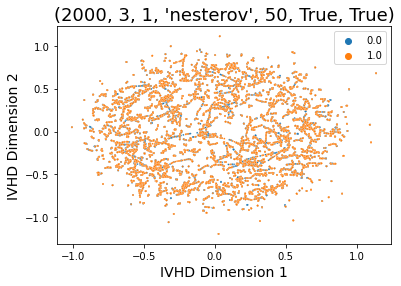

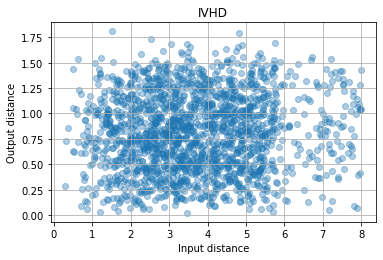

Plot for parameters: (2000, 3, 1, 'nesterov', 50, True, True)
ShepardDiagram calculation took 0.01 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


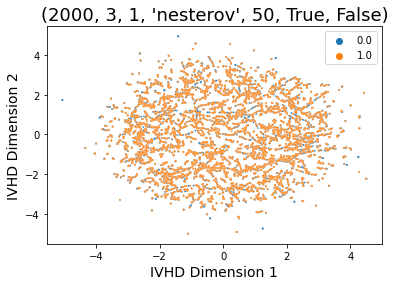

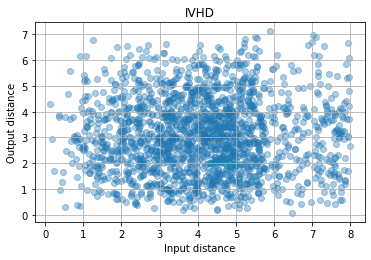

Plot for parameters: (2000, 3, 1, 'nesterov', 50, True, False)
ShepardDiagram calculation took 0.00 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


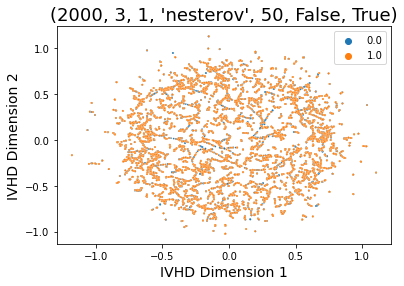

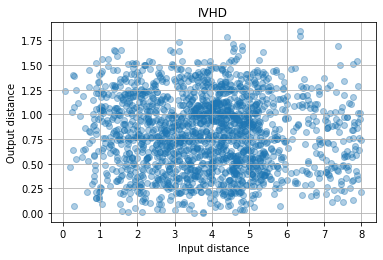

Plot for parameters: (2000, 3, 1, 'nesterov', 50, False, True)
ShepardDiagram calculation took 0.01 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


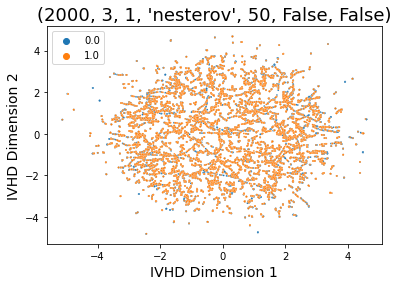

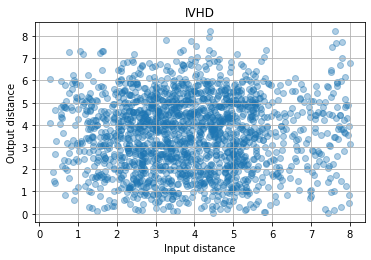

Plot for parameters: (2000, 3, 1, 'nesterov', 50, False, False)
ShepardDiagram calculation took 0.01 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


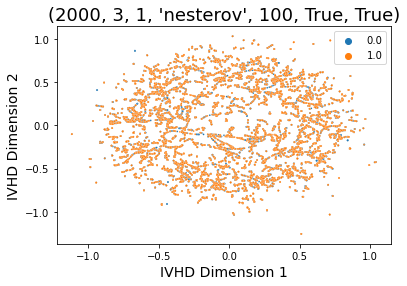

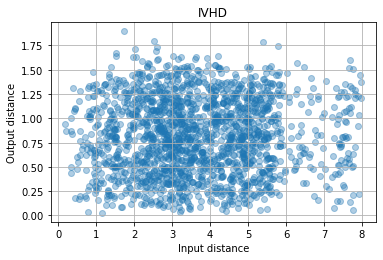

Plot for parameters: (2000, 3, 1, 'nesterov', 100, True, True)
ShepardDiagram calculation took 0.01 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


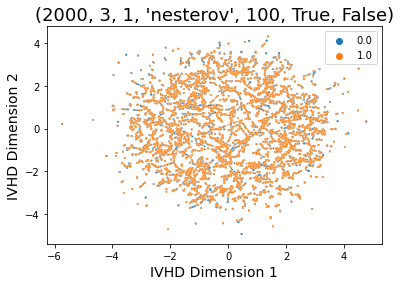

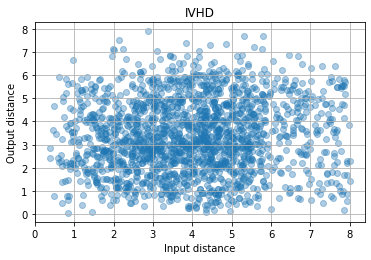

Plot for parameters: (2000, 3, 1, 'nesterov', 100, True, False)
ShepardDiagram calculation took 0.01 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


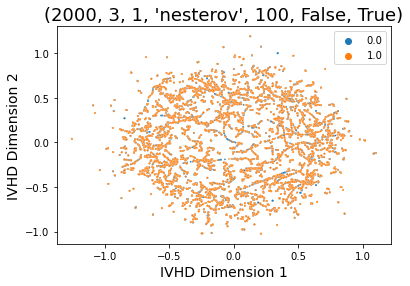

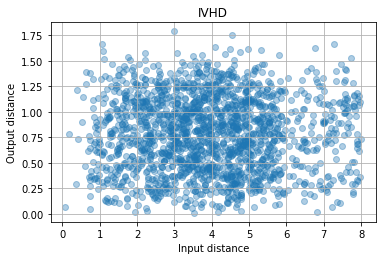

Plot for parameters: (2000, 3, 1, 'nesterov', 100, False, True)
ShepardDiagram calculation took 0.02 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


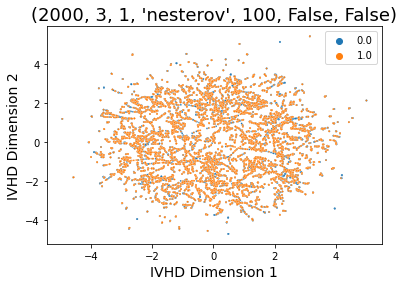

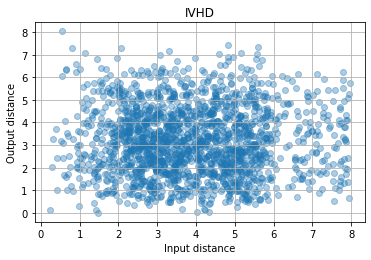

Plot for parameters: (2000, 3, 1, 'nesterov', 100, False, False)
ShepardDiagram calculation took 0.02 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


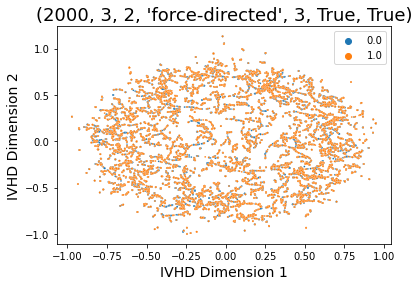

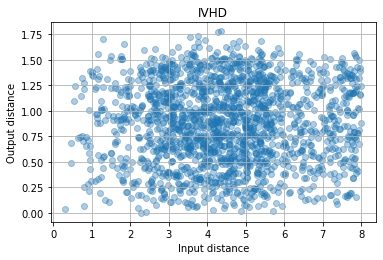

Plot for parameters: (2000, 3, 2, 'force-directed', 3, True, True)
ShepardDiagram calculation took 0.01 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


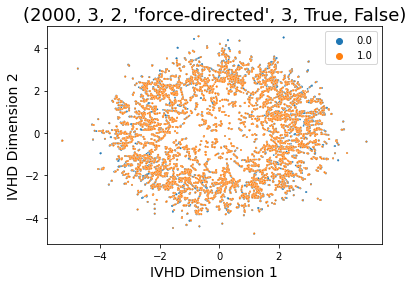

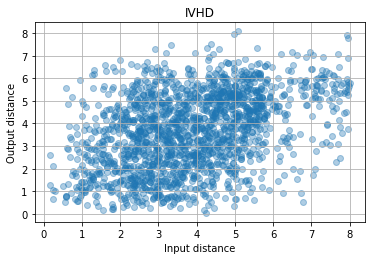

Plot for parameters: (2000, 3, 2, 'force-directed', 3, True, False)
ShepardDiagram calculation took 0.01 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


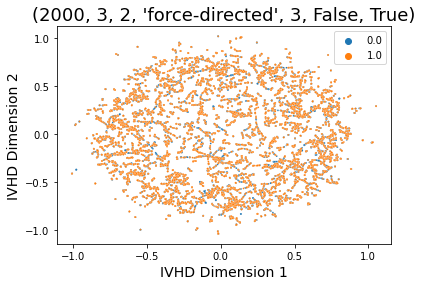

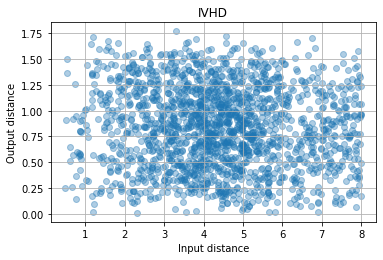

Plot for parameters: (2000, 3, 2, 'force-directed', 3, False, True)
ShepardDiagram calculation took 0.01 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


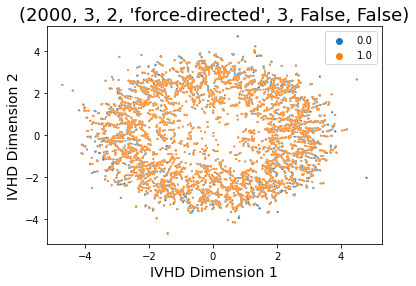

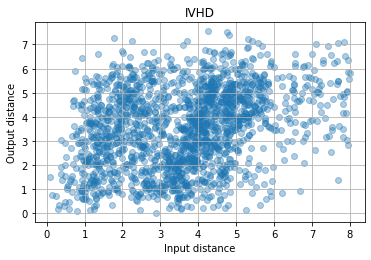

Plot for parameters: (2000, 3, 2, 'force-directed', 3, False, False)
ShepardDiagram calculation took 0.01 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


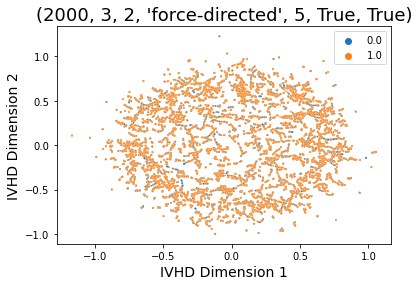

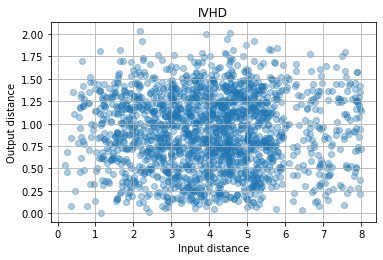

Plot for parameters: (2000, 3, 2, 'force-directed', 5, True, True)
ShepardDiagram calculation took 0.01 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


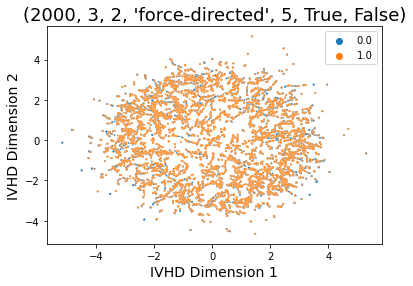

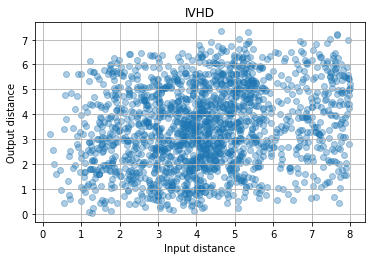

Plot for parameters: (2000, 3, 2, 'force-directed', 5, True, False)
ShepardDiagram calculation took 0.01 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


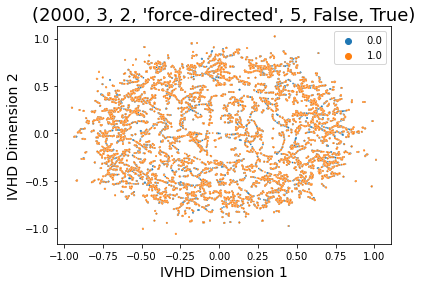

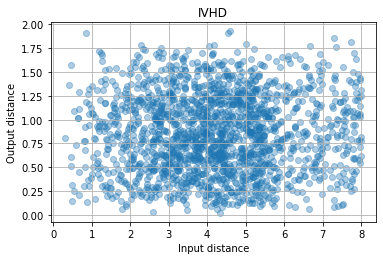

Plot for parameters: (2000, 3, 2, 'force-directed', 5, False, True)
ShepardDiagram calculation took 0.00 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


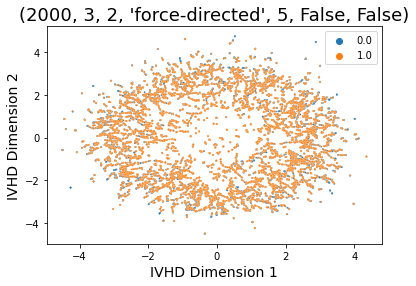

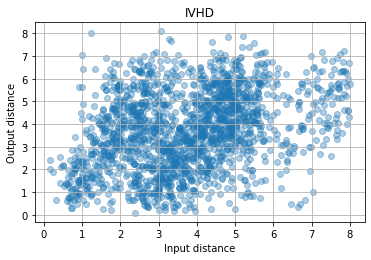

Plot for parameters: (2000, 3, 2, 'force-directed', 5, False, False)


In [ ]:
import os

def grid_search_ivhd():
    iterations = [2500, 3000]
    nearest_neighbors_count = [3,5, 7]
    random_neighbors_count = [1, 2, 4]
    caster_name = ["force-directed", "adadelta", "adam", "momentum", "nesterov"]
    graph_nn = [3,5, 7, 50,100]
    graph_is_cosine_metric = [True, False]
    binary_distances = [True, False]
    
    # Create the grid search parameter combinations
    parameter_combinations = [(it, nn, rn, cn, gnn, gcm, bd) for it in iterations for nn in nearest_neighbors_count for rn in random_neighbors_count
                              for cn in caster_name for gnn in graph_nn for gcm in graph_is_cosine_metric for bd in binary_distances]
    
#     # Create the output directory for saving plots
#     output_dir = "/Users/majkamiezianko/Desktop/IVHD/grid_search_plots"
#     os.makedirs(output_dir, exist_ok=True)
    
    # Perform the grid search
    for params in parameter_combinations:
        ivhd_plot_name = f"ivhd_plot_{params[0]}_{params[1]}_{params[2]}_{params[3]}_{params[4]}_{params[5]}_{params[6]}.png"
#         ivhd_plot_path = os.path.join(output_dir, ivhd_plot_name)
        
        # Call the ivhd function with the current parameter values
        ivhd(iterations=params[0], nearest_neighbors_count=params[1], random_neighbors_count=params[2], caster_name=params[3],
             graph_nn=params[4], graph_is_cosine_metric=params[5], capture_output=True, return_result=False,
             plot_result=True, binary_distances=params[6], plot_name = f"IVHD params: {params}")
        
        
        print(f"Plot for parameters: {params}")

# Perform the grid search
grid_search_ivhd()


Searching...
Finished.
0:00:00.101026
[Info] [CSV Parser] Loading dataset from file: /opt/viskit/data.csv
[Info] [CSV Parser] Loading labels from file: /opt/viskit/labels.csv
[Info] [CSV Parser] Labels file passed.
[Info] [CSV Parser] Dataset size: 20000
[Info] [CSV Parser] Dataset dimensionality: 3
[Info] [CSV Parser] Number of classes in dataset: 2
[Info] [CSV Parser] Finished.
[Info] [Graph] Loading graph from cache...
[Info] [Graph] Using regular distances...
[Info] [Graph] Finished.
[Info] [kNN Generator] Determining random neighbors...
[Info] [kNN Generator] Finished.
[Info] [kNN Generator] Neighbors in graph: 60000
rm: data.csv: No such file or directory
rm: labels.csv: No such file or directory
rm: output.csv: No such file or directory
ShepardDiagram calculation took 0.02 seconds.


/Users/majkamiezianko/.conda/envs/untitled2/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


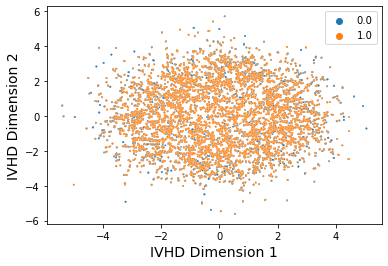

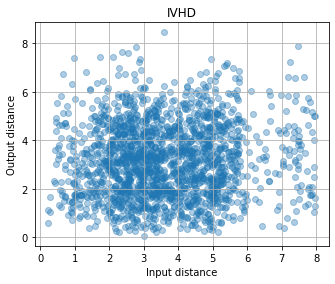

In [29]:
ivhd(iterations=2000, nearest_neighbors_count=2, random_neighbors_count=1,
     graph_nn=10, capture_output=False, graph_is_cosine_metric=True, caster_name="nesterov")

Metrics

In [18]:
import pandas as pd
from sklearn.metrics.pairwise import euclidean_distances
# from .metric import Metric, measure_time
import numpy as np
import matplotlib.pyplot as plt

from abc import ABC, abstractmethod
from time import perf_counter
from functools import wraps
import numpy as np


def measure_time(func):
    @wraps(func)
    def inner(*args, **kwargs):
        start = perf_counter()
        result = func(*args, **kwargs)
        elapsed = perf_counter() - start
        print(f"{func.__qualname__.split('.')[0]} calculation "
              f"took {elapsed:.2f} seconds.")
        return result
    return inner


class Metric(ABC):

    @abstractmethod
    def _get_labels(self) -> list:
        pass

    @abstractmethod
    def calculate(self, df_data, df_labels) -> np.float32:
        pass

class ShepardDiagram(Metric):
    def __init__(self, df_data: pd.DataFrame, df_embedding: pd.DataFrame, df_labels: pd.Series, n_sample: int = 30):
        self._df_data = df_data
        self._df_embedding = df_embedding
        self._df_labels = df_labels
        self.original_distances = None
        self.embedding_distances = None
        self._n_sample = n_sample

    def _get_labels(self) -> list:
        return list(set(self._df_labels.iloc[:,0].unique()))

    def _get_sample(self):
        indexes = []
        labels = self._get_labels()
        for label in labels:
            label_sample = self._df_labels[self._df_labels == label].sample(self._n_sample)
            indexes = indexes + list(label_sample.index.values.astype(int))

        return indexes

    @staticmethod
    def _delete_diagonal(matrix):
        m = matrix.shape[0]
        strided = np.lib.stride_tricks.as_strided
        s0, s1 = matrix.strides
        return strided(matrix.ravel()[1:], shape=(m - 1, m), strides=(s0 + s1, s1)).reshape(m, -1)

    @measure_time
    def calculate(self):
        indexes = self._get_sample()
        original_sample = self._df_data.iloc[indexes]
        embedded_sample = self._df_embedding.iloc[indexes]

        original_distances = euclidean_distances(original_sample)
        original_distances = self._delete_diagonal(original_distances)
        embedded_distances = euclidean_distances(embedded_sample)
        embedded_distances = self._delete_diagonal(embedded_distances)

        self.original_distances = np.reshape(original_distances,
                                             (original_distances.shape[0] * original_distances.shape[1], 1))
        self.embedding_distances = np.reshape(embedded_distances,
                                              (embedded_distances.shape[0] * embedded_distances.shape[1], 1))

    def show(self):
        plt.scatter(self.original_distances, self.embedding_distances, alpha=0.7)
        plt.xlabel('Input distance')
        plt.ylabel('Output distance')
        plt.grid()
        plt.show()
        
        
        
        
### KNN GAIN ###

# code from labs

import numba
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random

from scipy.spatial.distance import squareform, pdist
from sklearn.model_selection import train_test_split

markers = ["x", "o", "s", "*", "^", ".", "X"]
colors = ["red", "blue", "green", "brown", "orange", "cyan", "grey", "purple"]


@numba.jit(nopython=True)
def knngain(d_hd, d_ld, labels):
    # Number of data points
    N = d_hd.shape[0]
    N_1 = N - 1
    k_hd = np.zeros(shape=N_1, dtype=np.int64)
    k_ld = np.zeros(shape=N_1, dtype=np.int64)
    # For each data point
    for i in range(N):
        c_i = labels[i]
        di_hd = d_hd[i, :].argsort(kind="mergesort")
        di_ld = d_ld[i, :].argsort(kind="mergesort")
        # Making sure that i is first in di_hd and di_ld
        for arr in [di_hd, di_ld]:
            for idj, j in enumerate(arr):
                if j == i:
                    idi = idj
                    break
            if idi != 0:
                arr[idi] = arr[0]
            arr = arr[1:]
        for k in range(N_1):
            if c_i == labels[di_hd[k]]:
                k_hd[k] += 1
            if c_i == labels[di_ld[k]]:
                k_ld[k] += 1
    # Computing the KNN gain
    gn = (k_ld.cumsum() - k_hd.cumsum()).astype(np.float64) / (
        (1.0 + np.arange(N_1)) * N
    )
    # Returning the KNN gain and its AUC
    return gn, eval_auc(gn)


@numba.jit(nopython=True)
def eval_auc(arr):
    i_all_k = 1.0 / (np.arange(arr.size) + 1.0)
    return np.float64(arr.dot(i_all_k)) / (i_all_k.sum())


@numba.jit(nopython=True)
def eval_rnx(Q):
    N_1 = Q.shape[0]
    N = N_1 + 1
    # Computing Q_NX
    qnxk = np.empty(shape=N_1, dtype=np.float64)
    acc_q = 0.0
    for K in range(N_1):
        acc_q += Q[K, K] + np.sum(Q[K, :K]) + np.sum(Q[:K, K])
        qnxk[K] = acc_q / ((K + 1) * N)
    # Computing R_NX
    arr_K = np.arange(N_1)[1:].astype(np.float64)
    rnxk = (N_1 * qnxk[: N_1 - 1] - arr_K) / (N_1 - arr_K)
    # Returning
    return rnxk


In [19]:
def draw_diagram(x, y, title, ax):
    ax.scatter(x, y, alpha=0.2)
    ax.set_xlabel('Input distance')
    ax.set_ylabel('Output distance')
    plt.title(title)
    ax.grid()

In [196]:
ivhd_embedding = pd.read_csv("/Users/majkamiezianko/Desktop/IVHD/output.csv")
df_data_full = pd.read_csv("/Users/majkamiezianko/Desktop/IVHD/data.csv")
df_labels_full = pd.read_csv("/Users/majkamiezianko/Desktop/IVHD/labels.csv")


ivhd_euclidean_diagram = ShepardDiagram(df_data_full, ivhd_embedding.iloc[:,:2], df_labels_full)
ivhd_euclidean_diagram.calculate()
fig = plt.figure(figsize=(20, 24), constrained_layout=True)
spec = fig.add_gridspec(3, 2)

ax00 = fig.add_subplot(spec[0, 0])
draw_diagram(ivhd_euclidean_diagram.original_distances,ivhd_euclidean_diagram.embedding_distances,'IVHD', ax00)

ShepardDiagram calculation took 0.17 seconds.


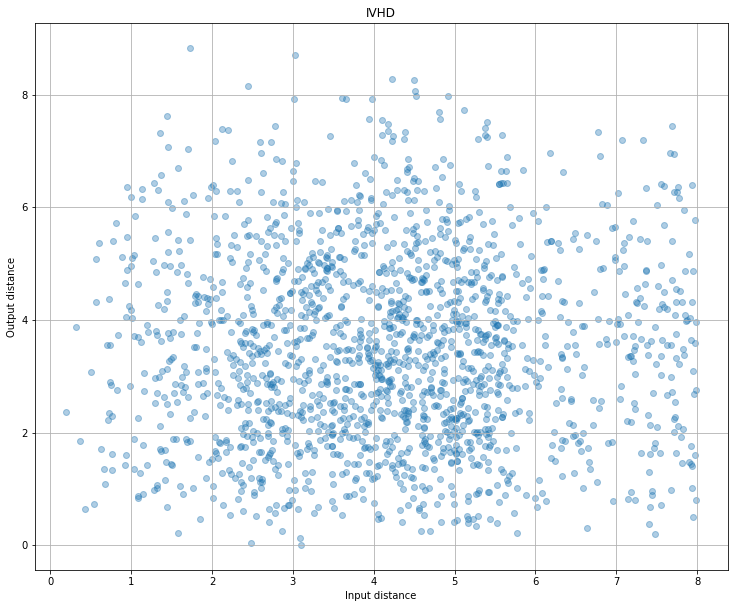

In [ ]:
# def generate_points_in_torus(N, R, r, horizontal=True, center=(0, 0, 0)):
#     """Generate N points in a torus (vertical or horizontal) with major radius R, minor radius r with given center."""
#     points = []
#     for i in range(N):
#         theta = np.random.uniform(0, 2 * np.pi)
#         phi = np.random.uniform(0, 2 * np.pi)
#         x0, y0, z0 = center
#         x = (R + r * np.cos(phi)) * np.cos(theta) + x0
#         y = (R + r * np.cos(phi)) * np.sin(theta) + y0
#         z = r * np.sin(phi) + z0
#         if horizontal:
#             points.append([x, y, z])
#         else:
#             points.append([x, z, y])
#     return np.array(points)

In [ ]:
# horizontal_torus_points = generate_points_in_torus(1000, 1, 0.25)
# vertical_torus_points = generate_points_in_torus(1000, 1, 0.25, horizontal=False, center=(0.75, 0, 0))
# plot_two_figures(horizontal_torus_points, vertical_torus_points)


In [ ]:
# ivhd(horizontal_torus_points, vertical_torus_points, iterations=5000, nearest_neighbors_count=10,
#      random_neighbors_count=5,
#      graph_nn=100, capture_output=False, graph_is_cosine_metric=False, caster_name="adam")